# SV and DU test results of the mouse olfactory bulb (MOB)

In [1]:
import torch
import numpy as np
from scipy.io import mmread
from scipy.stats import spearmanr, chisquare, chi2_contingency
import pandas as pd
import itertools
import matplotlib.pyplot as plt
from plotnine import *

import scanpy as sc

from isosde.utils import get_cov_sp, counts_to_ratios, load_visium_sp_meta

In [2]:
data_dir = "/Users/jysumac/Projects/SPLISOSM_paper/data/sit_nar_23/"
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/sit_nar_23/"
date = '1107'

## Spatial variablility (SV) tests

### Load SV test results

In [3]:
df_sv_mob = pd.read_csv(f"{res_dir}/sv_results/mob_sv_combined_{date}.csv", index_col=0)

# define significant events
df_sv_mob['is_ont_svs'] = df_sv_mob['pvalue_hsic-ir'] < 0.05
df_sv_mob['is_ont_sve'] = df_sv_mob['pvalue_hsic-gc'] < 0.05
df_sv_mob['is_ont_expressed'] = df_sv_mob['count_avg'] > 0.5

df_sv_mob.groupby(['is_ont_expressed', 'is_ont_svs', 'is_ont_sve']).size()

is_ont_expressed  is_ont_svs  is_ont_sve
False             False       False         484
                              True          806
                  True        False          30
                              True           65
True              False       True          434
                  True        True           52
dtype: int64

### Compare SV test p-values

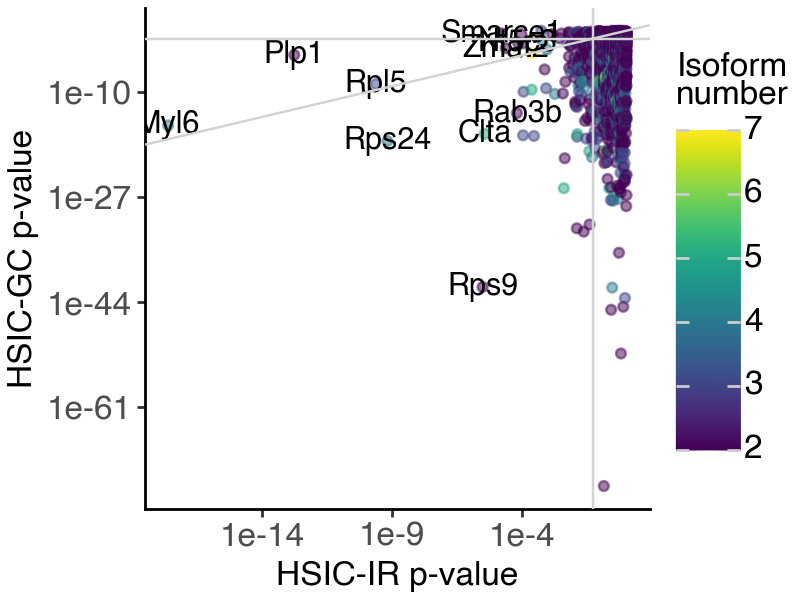

In [4]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'pvalue_hsic-ir', y = 'pvalue_hsic-gc')) +
        geom_point(aes(color = 'n_iso'), alpha = 0.5) + 
        geom_text(
            _df.nsmallest(10, 'pvalue_hsic-ir').reset_index(),
            aes(label = 'gene_symbol')
        ) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(x = 'HSIC-IR p-value', y = 'HSIC-GC p-value', color = 'Isoform\nnumber') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[4,3],
             text=element_text(size = 12))
)

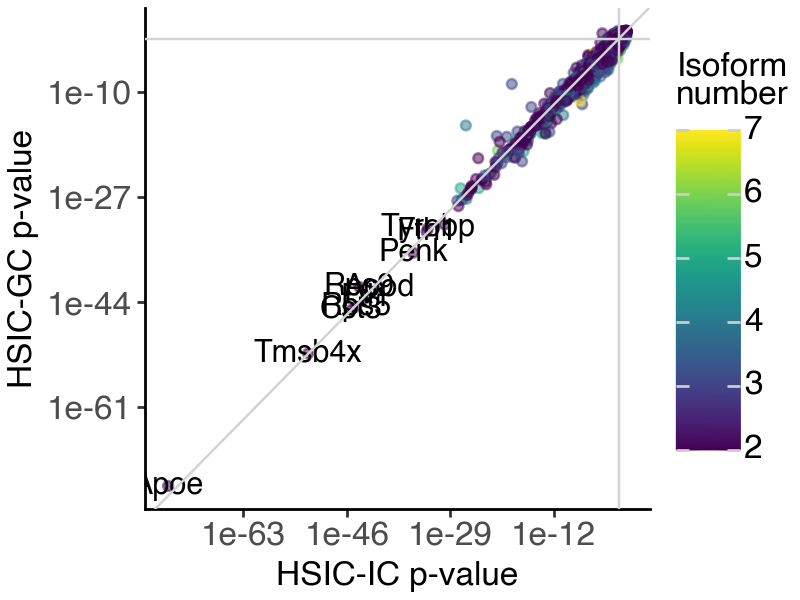

In [5]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'pvalue_hsic-ic', y = 'pvalue_hsic-gc')) +
        geom_point(aes(color = 'n_iso'), alpha = 0.5) + 
        geom_text(
            _df.nsmallest(10, 'pvalue_hsic-ic').reset_index(),
            aes(label = 'gene_symbol')
        ) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(x = 'HSIC-IC p-value', y = 'HSIC-GC p-value', color = 'Isoform\nnumber') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[4,3],
             text=element_text(size = 12))
)

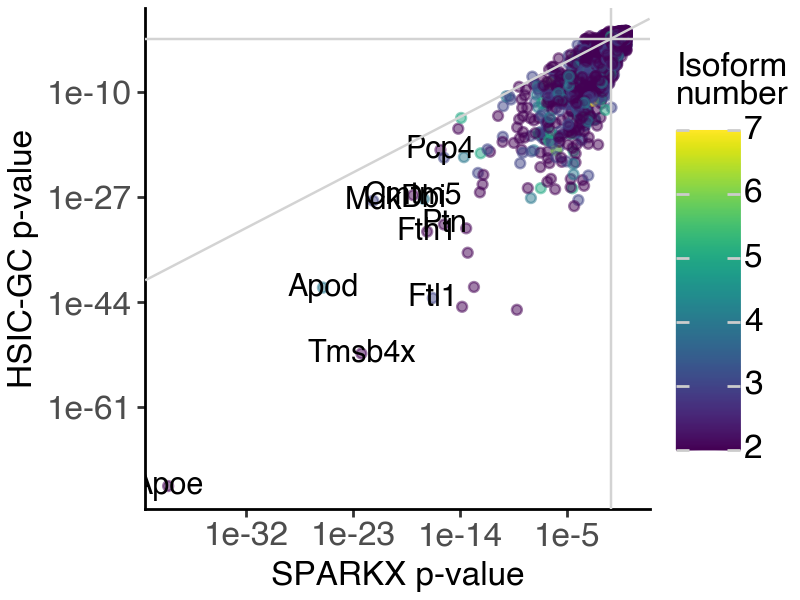

In [6]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'pvalue_spark-x', y = 'pvalue_hsic-gc')) +
        geom_point(aes(color = 'n_iso'), alpha = 0.5) + 
        geom_text(
            _df.nsmallest(10, 'pvalue_spark-x').reset_index(),
            aes(label = 'gene_symbol')
        ) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(x = 'SPARKX p-value', y = 'HSIC-GC p-value', color = 'Isoform\nnumber') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[4,3],
             text=element_text(size = 12))
)

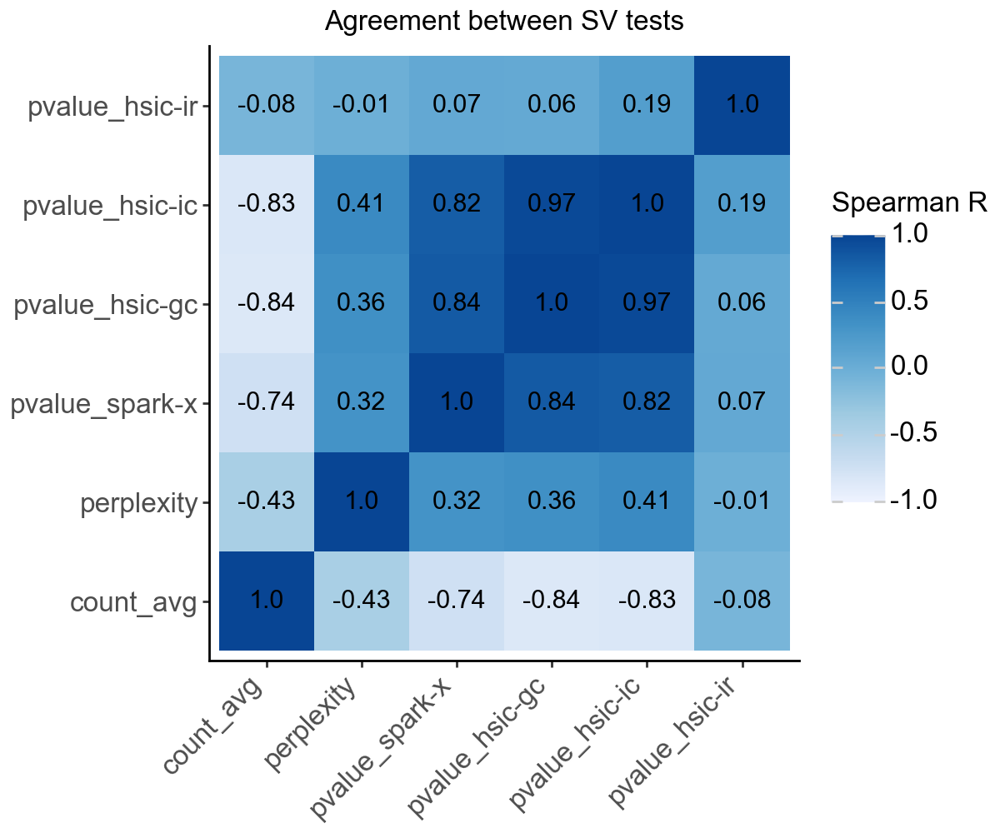

In [7]:
# _df = df_sv_mob.loc[
#     df_sv_mob['is_ont_expressed'], 
#     ['count_avg', 'perplexity', 'pvalue_hsic-ir', 'pvalue_hsic-ic', 'pvalue_hsic-gc', 'pvalue_spark-x']
# ]
_df = df_sv_mob.loc[:, ['count_avg', 'perplexity', 'pvalue_hsic-ir', 'pvalue_hsic-ic', 'pvalue_hsic-gc', 'pvalue_spark-x']]
_conf_mat = pd.DataFrame(
    spearmanr(_df)[0], 
    columns = _df.columns, 
    index = _df.columns
).reset_index(names='id')
_conf_mat = pd.melt(_conf_mat, id_vars='id').round(2)

_order = ['count_avg', 'perplexity', 'pvalue_spark-x', 'pvalue_hsic-gc', 'pvalue_hsic-ic', 'pvalue_hsic-ir']
_conf_mat['id'] = pd.Categorical(_conf_mat['id'], ordered=True, categories=_order)
_conf_mat['variable'] = pd.Categorical(_conf_mat['variable'], ordered=True, categories=_order)

(
    ggplot(_conf_mat, aes(x = 'id', y = 'variable', fill = 'value')) + 
        geom_tile() + 
        geom_text(aes(label = 'value')) + 
        scale_fill_distiller(limits = (-1, 1), direction = 1) + 
        labs(x = '', y = '', fill = 'Spearman R', title = 'Agreement between SV tests') + 
        theme_classic() + 
        theme(
            figure_size=[6, 5],
            text = element_text(family='Arial', size = 12), 
            axis_text_x=element_text(rotation=45, hjust = 1, vjust = 1)
        )
)

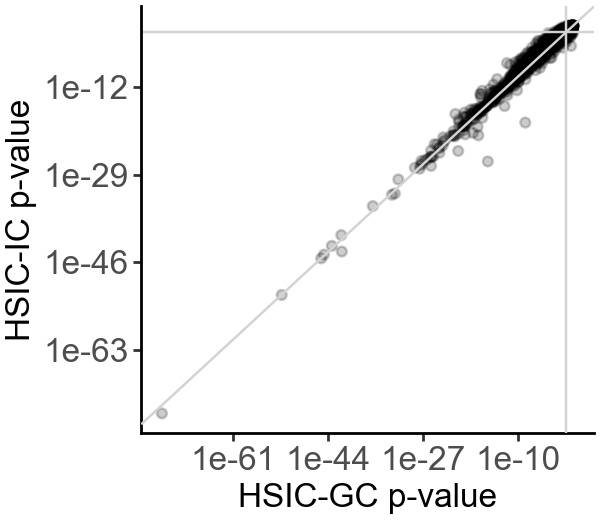

In [8]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'pvalue_hsic-gc', y = 'pvalue_hsic-ic')) +
        # stat_density_2d(levels = 5) + 
        geom_point(alpha = 0.2) + 
        # geom_point(aes(color = 'n_iso'), alpha = 0.5) + 
        # geom_text(
        #     _df.nsmallest(10, 'pvalue_spark-x').reset_index(),
        #     aes(label = 'gene_symbol')
        # ) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(x = 'HSIC-GC p-value', y = 'HSIC-IC p-value') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[3,2.6],
              text = element_text(family='Arial', size = 12))
)

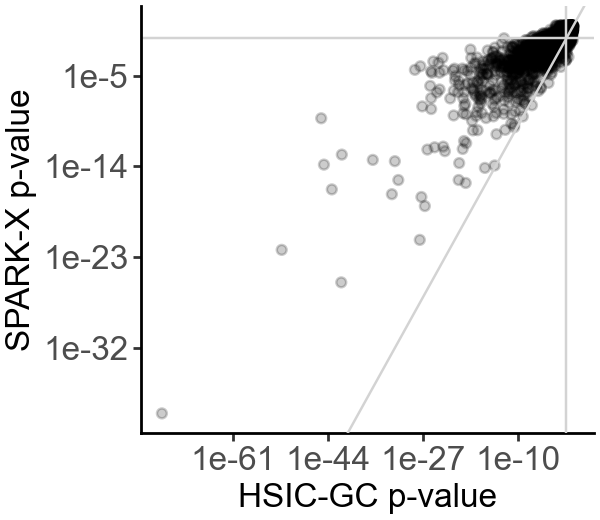

In [9]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'pvalue_hsic-gc', y = 'pvalue_spark-x')) +
        # stat_density_2d(levels = 5) + 
        geom_point(alpha = 0.2) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(x = 'HSIC-GC p-value', y = 'SPARK-X p-value') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[3,2.6],
              text = element_text(family='Arial', size = 12))
)

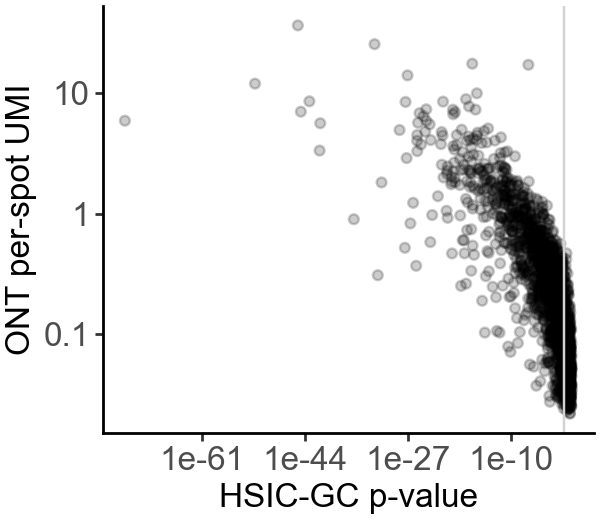

In [10]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'pvalue_hsic-gc', y = 'count_avg')) +
        # stat_density_2d(levels = 5) + 
        geom_point(alpha = 0.2) + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        labs(x = 'HSIC-GC p-value', y = 'ONT per-spot UMI') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[3,2.6],
              text = element_text(family='Arial', size = 12))
)

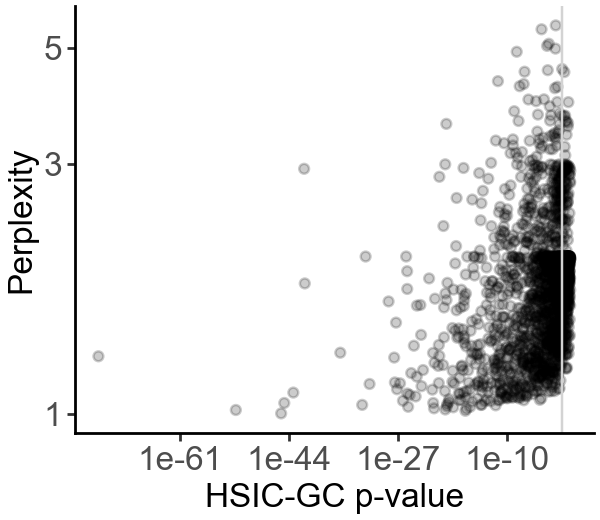

In [11]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'pvalue_hsic-gc', y = 'perplexity')) +
        # stat_density_2d(levels = 5) + 
        geom_point(alpha = 0.2) + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        labs(x = 'HSIC-GC p-value', y = 'Perplexity') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[3,2.6],
              text = element_text(family='Arial', size = 12))
)

### Check SV gene expression

#### ONT data sparsity

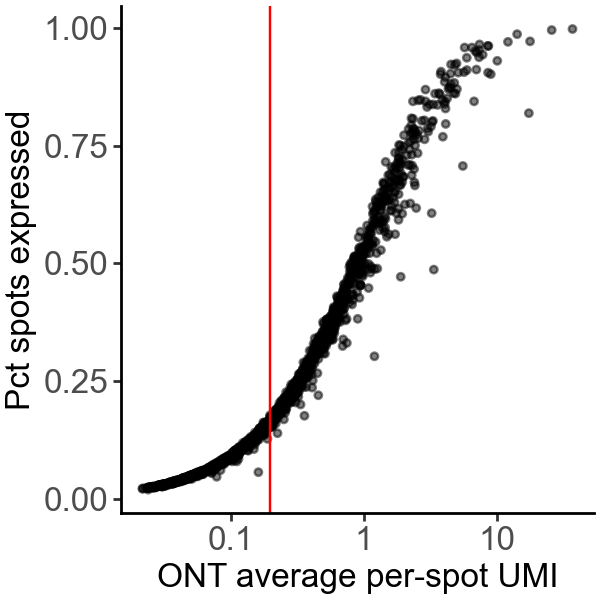

In [12]:
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(y = 'pct_spot_on', x = 'count_avg')) + 
        geom_point(alpha = 0.5, size = 1) + 
        geom_vline(xintercept = _df['count_avg'].median(), color = 'red') + 
        scale_x_log10() + 
        labs(x = 'ONT average per-spot UMI', y = 'Pct spots expressed') + 
        theme_classic() + 
        theme(
            figure_size=[3, 3],
            text = element_text(family='arial', size = 12),
        )
)

#### ONT expression of SV genes

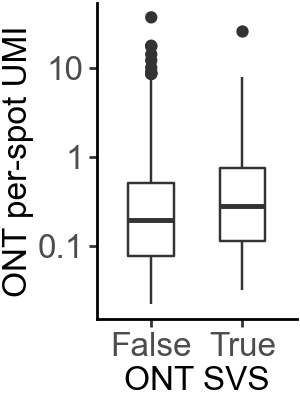

In [13]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'is_ont_svs', y = 'count_avg')) + 
        geom_boxplot(width = 0.5) + 
        scale_y_log10() + 
        labs(x = 'ONT SVS', y = 'ONT per-spot UMI') + 
        # scale_fill_manual(values={True: _pal['svs'], False: _pal['not_svs']}) + 
        theme_classic() + 
        theme(
            figure_size=[1.5, 2],
            text = element_text(family='arial', size = 12),
            legend_position='none'
        )
)

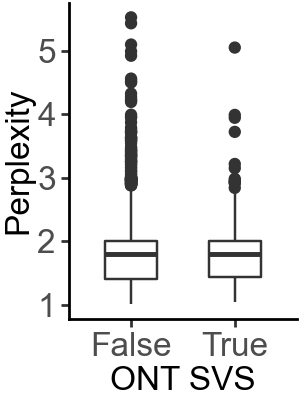

In [14]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'is_ont_svs', y = 'perplexity')) + 
        geom_boxplot(width = 0.5) + 
        # scale_y_log10() + 
        labs(x = 'ONT SVS', y = 'Perplexity') + 
        # scale_fill_manual(values={True: _pal['svs'], False: _pal['not_svs']}) + 
        theme_classic() + 
        theme(
            figure_size=[1.5, 2],
            text = element_text(family='arial', size = 12),
            legend_position='none'
        )
)

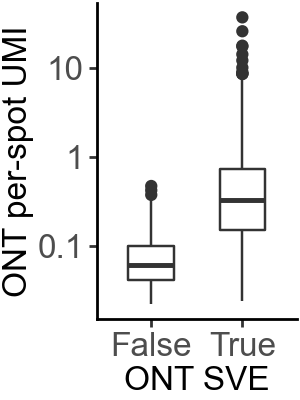

In [15]:
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'is_ont_sve', y = 'count_avg')) + 
        geom_boxplot(width = 0.5) + 
        scale_y_log10() + 
        labs(x = 'ONT SVE', y = 'ONT per-spot UMI') + 
        # scale_fill_manual(values={True: _pal['svs'], False: _pal['not_svs']}) + 
        theme_classic() + 
        theme(
            figure_size=[1.5, 2],
            text = element_text(family='arial', size = 12),
            legend_position='none'
        )
)

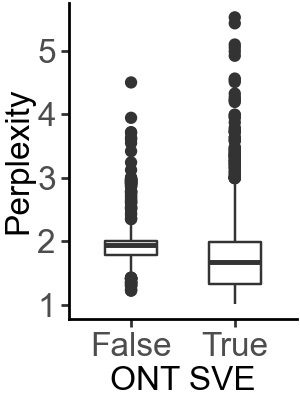

In [16]:
# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].reset_index(names = 'gene_symbol')
_df = df_sv_mob.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'is_ont_sve', y = 'perplexity')) + 
        geom_boxplot(width = 0.5) + 
        # scale_y_log10() + 
        labs(x = 'ONT SVE', y = 'Perplexity') + 
        # scale_fill_manual(values={True: _pal['svs'], False: _pal['not_svs']}) + 
        theme_classic() + 
        theme(
            figure_size=[1.5, 2],
            text = element_text(family='arial', size = 12),
            legend_position='none'
        )
)

#### Visium expression of SV genes

In [17]:
# load short-reads expression
adata_visium = sc.read_h5ad(f"{data_dir}/mob/anndata/mob_spatial.h5ad") # long-read isoform counts
adata_visium.raw = adata_visium.copy() # raw counts data

# filter out barely expressed genes
sc.pp.filter_genes(adata_visium, min_cells=0.01 * adata_visium.shape[0])
adata_visium.layers['counts'] = adata_visium.X.copy()

# log normalize
sc.pp.normalize_total(adata_visium, target_sum=1e4)
sc.pp.log1p(adata_visium)
adata_visium.layers['log1p'] = adata_visium.X.copy()

# load the Visium spatial metadata 
adata_visium = load_visium_sp_meta(adata_visium, f"{data_dir}/mob/visium_spatial_meta", library_id='adata_visium')

/Users/jysumac/Projects/SpatialSplicing/isosde/utils.py:281: UserWarning: Missing 'hires' image in /Users/jysumac/Projects/SPLISOSM_paper/data/sit_nar_23//mob/visium_spatial_meta. Will be ignored.


In [18]:
df_gene_visium = adata_visium.var.copy()
df_gene_visium['count_avg_visium'] = np.asarray(adata_visium.layers['counts'].mean(0)).squeeze()
df_gene_visium['ont_pass_qc'] = df_gene_visium.index.isin(df_sv_mob.index)

# add ONT qc results
df_gene_visium = pd.merge(
    df_gene_visium, df_sv_mob, 
    left_index=True, right_index=True, how = 'left'
)

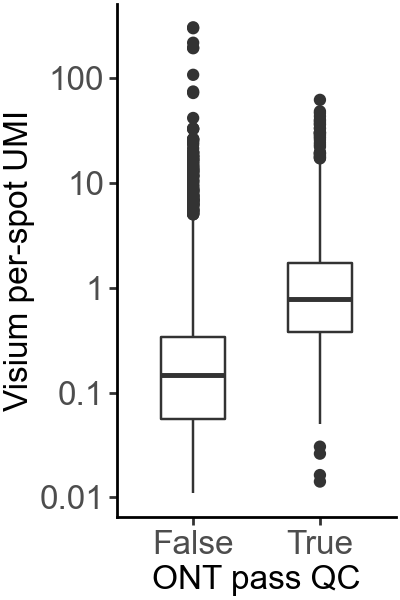

In [19]:
_df = df_gene_visium.reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'ont_pass_qc', y = 'count_avg_visium')) + 
        geom_boxplot(width = 0.5) + 
        scale_y_log10() + 
        labs(x = 'ONT pass QC', y = 'Visium per-spot UMI') + 
        theme_classic() + 
        theme(
            figure_size=[2, 3],
            text = element_text(family='arial', size = 12),
            legend_position='none'
        )
)

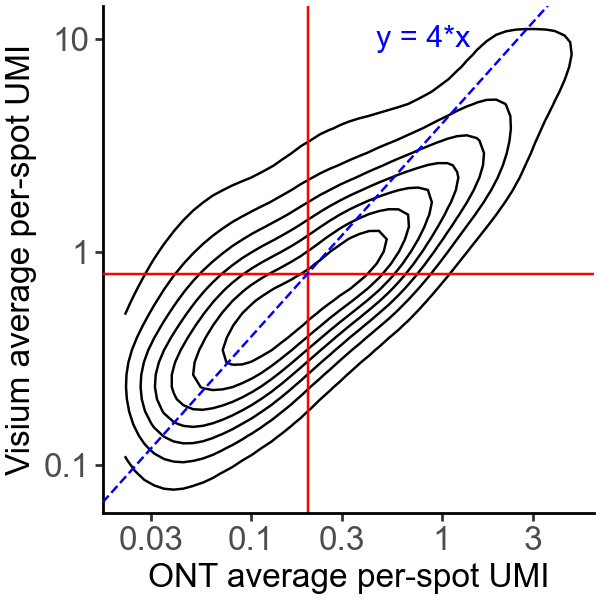

In [20]:
_df = df_gene_visium.loc[df_gene_visium['ont_pass_qc']].reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'count_avg', y = 'count_avg_visium')) + 
        # geom_point(alpha = 0.2) + 
        stat_density_2d(levels = 10) + 
        geom_vline(xintercept = _df['count_avg'].median(), color = 'red') + 
        geom_hline(yintercept = _df['count_avg_visium'].median(), color = 'red') + 
        # geom_abline(slope = 1, color = 'gray') + 
        scale_y_log10() + 
        scale_x_log10() + 
        geom_abline(slope = 1, intercept = np.log10(4), color = 'blue', linetype = 'dashed') + 
        geom_text(
            data = pd.DataFrame([{'x': 0.8, 'y': 10, 'label': 'y = 4*x'}]),
            mapping = aes(x = 'x', y = 'y', label = 'label'),
            color = 'blue'
        ) + 
        labs(y = 'Visium average per-spot UMI', x = 'ONT average per-spot UMI') + 
        theme_classic() + 
        theme(
            figure_size=[3, 3],
            text = element_text(family='arial', size = 12)
        )
)

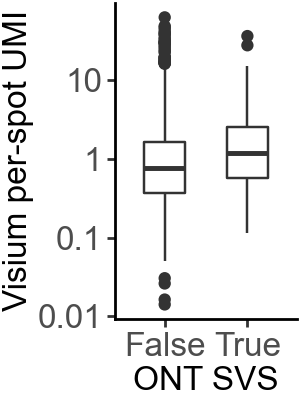

In [21]:
_df = df_gene_visium.loc[df_gene_visium['ont_pass_qc']].reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'is_ont_svs', y = 'count_avg_visium')) + 
        geom_boxplot(width = 0.5) + 
        scale_y_log10() + 
        labs(x = 'ONT SVS', y = 'Visium per-spot UMI') + 
        theme_classic() + 
        theme(
            figure_size=[1.5, 2],
            text = element_text(family='arial', size = 12),
            legend_position='none'
        )
)

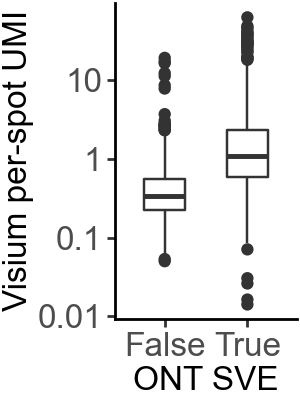

In [22]:
_df = df_gene_visium.loc[df_gene_visium['ont_pass_qc']].reset_index(names = 'gene_symbol')
(
    ggplot(_df, aes(x = 'is_ont_sve', y = 'count_avg_visium')) + 
        geom_boxplot(width = 0.5) + 
        scale_y_log10() + 
        labs(x = 'ONT SVE', y = 'Visium per-spot UMI') + 
        theme_classic() + 
        theme(
            figure_size=[1.5, 2],
            text = element_text(family='arial', size = 12),
            legend_position='none'
        )
)

### Functional enrichment analysis

In [23]:
def get_enrich_res(
    svs_gene_list,
    svens_gene_list,
    sources_list = ['GO:BP'],
    topk = 20,
    return_enr_res = False
):
    # run enrichment analysis
    enr_svs = sc.queries.enrich(
        svs_gene_list, org="mmusculus", 
        gprofiler_kwargs = {'all_results': True, 'sources': sources_list},
    )
    enr_svens = sc.queries.enrich(
        svens_gene_list, org="mmusculus", 
        gprofiler_kwargs = {'all_results': True, 'sources': sources_list},
    )

    # extract significant positive and negative functional terms
    _top_term_svs = enr_svs.loc[enr_svs['significant'], 'native'].to_list()
    _top_go_svens = enr_svens.loc[enr_svens['significant'], 'native'].to_list()
    
    # combine results
    df_term = pd.concat([
        enr_svs.loc[
            enr_svs['native'].isin(_top_term_svs + _top_go_svens),
            # ['source', 'native', 'name', 'description', 'term_size']
        ].assign(geneset = 'SVS'),
        enr_svens.loc[
            enr_svens['native'].isin(_top_term_svs + _top_go_svens),
            # ['source', 'native', 'name', 'description', 'term_size']
        ].assign(geneset = 'SVE'),
    ])
    
    # calculated precision differences
    unstacked = df_term.groupby(['native', 'geneset'])['precision'].mean().unstack()
    unstacked['precision_diff'] = unstacked['SVS'] - unstacked['SVE']
    df_term = df_term.merge(unstacked[['precision_diff']], on='native', how='left')
    
    # sort terms by the precision difference and keep top terms
    _order1 = df_term.sort_values('precision_diff', ascending=True).head(topk)['name'].unique().tolist()
    _order2 = df_term.sort_values('precision_diff', ascending=False).head(topk)['name'].unique().tolist()
    df_term = df_term.loc[df_term['name'].isin(_order1 + _order2)]

    # sort resulting dataframe by precision difference
    df_term.sort_values(by = 'precision_diff', inplace = True)
    df_term['name_cat'] = pd.Categorical(df_term['name'], ordered=True, categories=df_term['name'].unique())

    if not return_enr_res:
        return df_term
    else:
        return df_term, enr_svs, enr_svens

In [24]:
_df = df_sv_mob.copy()
_df.groupby(['is_ont_svs', 'is_ont_sve']).size()

# define the gene lists to compare
svs_gene_list = _df.index[_df['is_ont_svs']].to_list()
svens_gene_list = _df.index[(~ _df['is_ont_svs']) & (_df['is_ont_sve'])].to_list()

#### Gene Ontology Enrichment

In [25]:
df_go = get_enrich_res(svs_gene_list, svens_gene_list, sources_list=['GO:BP'], topk=20)
df_go['name_cat'] = pd.Categorical(
    df_go['name_cat'].str.capitalize(), 
    ordered = True, categories=df_go['name_cat'].str.capitalize().unique()
)

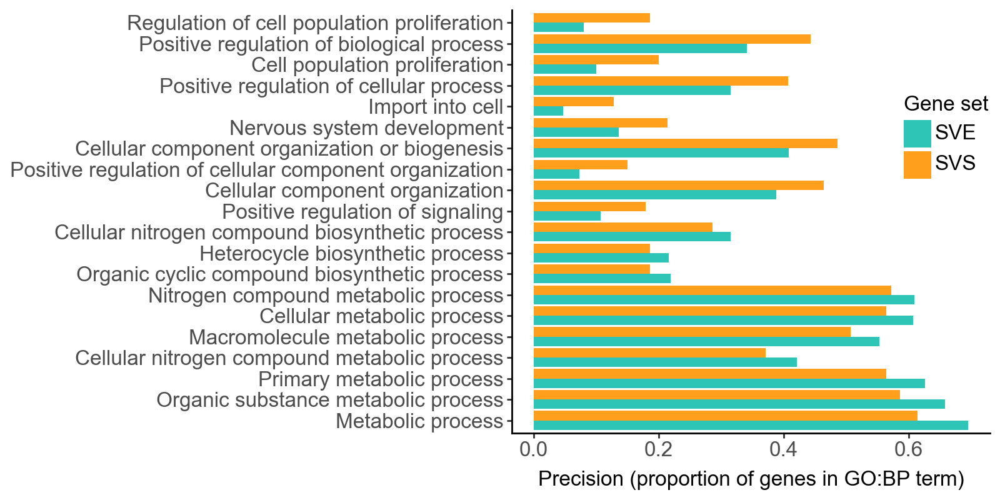

In [26]:
(
    ggplot(df_go, aes(x = 'name_cat', y = 'precision', group = 'geneset', fill = 'geneset')) + 
        geom_bar(stat='identity', position='dodge') + 
        labs(y = 'Precision (proportion of genes in GO:BP term)', x = '', fill = 'Gene set') + 
        coord_flip() + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(8,4),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (1,0.75)
        )
)

#### KEGG Enrichment

In [27]:
df_kegg = get_enrich_res(svs_gene_list, svens_gene_list, sources_list=['KEGG'], topk=20)

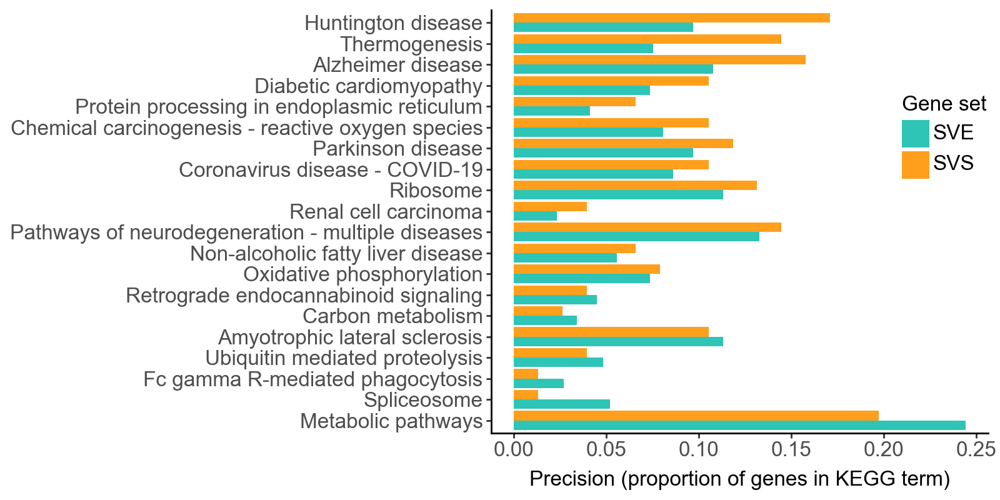

In [28]:
(
    ggplot(df_kegg, aes(x = 'name_cat', y = 'precision', group = 'geneset', fill = 'geneset')) + 
        geom_bar(stat='identity', position='dodge') + 
        labs(y = 'Precision (proportion of genes in KEGG term)', x = '', fill = 'Gene set') + 
        coord_flip() + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(8,4),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (1,0.75)
        )
)

#### Reactome Enrichment

In [29]:
df_reac = get_enrich_res(svs_gene_list, svens_gene_list, sources_list=['REAC'], topk=20)

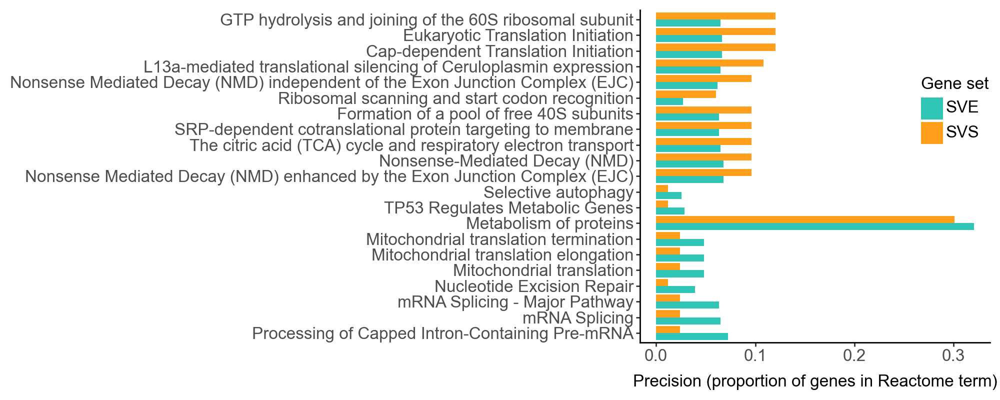

In [30]:
(
    ggplot(df_reac, aes(x = 'name_cat', y = 'precision', group = 'geneset', fill = 'geneset')) + 
        geom_bar(stat='identity', position='dodge') + 
        labs(y = 'Precision (proportion of genes in Reactome term)', x = '', fill = 'Gene set') + 
        coord_flip() + 
        scale_fill_manual(values={'SVS': '#FF9F1C', 'SVE': '#2EC4B6'}) + 
        theme_classic() + 
        theme(
            figure_size=(10,4),
            text=element_text(size = 12, family = 'Arial'),
            legend_position='inside',
            legend_position_inside = (1,0.75)
        )
)

## Prepare anndata with SV results

In [31]:
from smoother import SpatialWeightMatrix
from isosde.utils import extract_counts_n_ratios

# helper function to calculate smoothed counts and ratios
def calc_smoothed_counts_n_ratios(adata, p = 0.2):
    # compute spatial knn graph
    coords = adata.obs.loc[:, ['array_row', 'array_col']]
    swm = SpatialWeightMatrix()
    swm.calc_weights_knn(coords, k = 6)

    # compute locally smoothed isoform counts
    scaling = swm.swm.to_dense() * p + torch.eye(adata.shape[0]) * (1 - p) # (n_spots, n_spots)
    adata.layers['counts_smoothed'] = scaling.numpy() @ adata.layers['counts'] # (n_spots, n_total_isos)
    
    # calculate usage ratio from counts
    _, _, _, _ratio_merged = extract_counts_n_ratios(adata, layer = 'counts_smoothed', group_iso_by = 'gene_symbol')
    adata.layers['ratios_smoothed'] = _ratio_merged # (n_spots, n_total_isos)

    return adata

### Load and prepare anndata

#### Load Visium RBP anndata

In [12]:
# load the visium rbp count data
adata_visium_rbp = sc.read_h5ad(f"{res_dir}/anndata/mob_visium_rbp_{date}.h5ad")
adata_visium_rbp.var.groupby(['is_rbp', 'is_visium_sve']).size()

is_rbp  is_visium_sve
True    False            1259
        True              140
dtype: int64

#### Load ONT anndata and compute smoothed ratios

In [33]:
# load the ONT count data
adata_ont = sc.read_h5ad(f"{res_dir}/anndata/mob_ont_filtered_{date}.h5ad")
adata_ont

AnnData object with n_obs × n_vars = 918 × 4529
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'region', 'AtoI_total', 'AtoI_ratio', 'AtoI_detected', 'in_tissue', 'array_row', 'array_col'
    var: 'features', 'n_cells', 'gene_symbol', 'transcript_id', 'transcript_name'
    uns: 'log1p', 'spatial'
    obsm: 'spatial'
    layers: 'counts', 'log1p', 'ratios_obs'

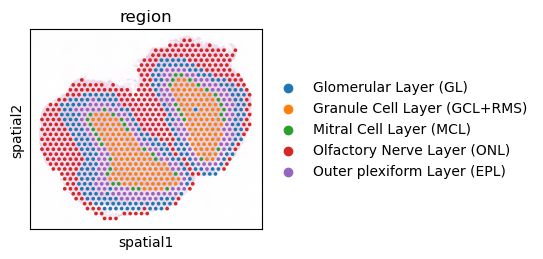

In [34]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_ont, color = ['region'], img_key = 'lowres', alpha_img=0.3)

In [35]:
# focus on expressed SVS genes only
_iso_ind = adata_ont.var['gene_symbol'].isin(
    df_sv_mob.loc[df_sv_mob['is_ont_svs'] & df_sv_mob['is_ont_expressed']].index
)
adata_ont_sv = adata_ont[:, _iso_ind].copy()

# compute smoothed counts and ratios
adata_ont_sv = calc_smoothed_counts_n_ratios(adata_ont_sv, p = 0.2)

Number of spots: 918. Average number of neighbors per spot:  6.00.


#### Load GLMM fitting results

In [36]:
# load fitted GLMM model and extract inferred isoform ratio
glmm = torch.load(f"{res_dir}/model/mob_glmm_{date}.pkl")
glmm_model_list = glmm.get_fitted_models()

In [37]:
# extract estimated ratio
iso_ind_list = []

for i, (_gene, _group) in enumerate(adata_ont_sv.var.reset_index().groupby('gene_symbol')):
    assert glmm.gene_names[i] == _gene
    # extract isoform index per gene
    iso_ind_list.append(_group.index.tolist())

ratio_fitted_list = [_m.get_isoform_ratio().squeeze() for _m in glmm_model_list]

# reshape and store the fitted ratio in anndata
ratio_fitted_merged = torch.concat(ratio_fitted_list, axis = 1).numpy()
ratio_fitted_merged = ratio_fitted_merged[:, np.argsort(np.concatenate(iso_ind_list))]

adata_ont_sv.layers['ratios_glmm'] = ratio_fitted_merged.copy()

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_30229/801697142.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


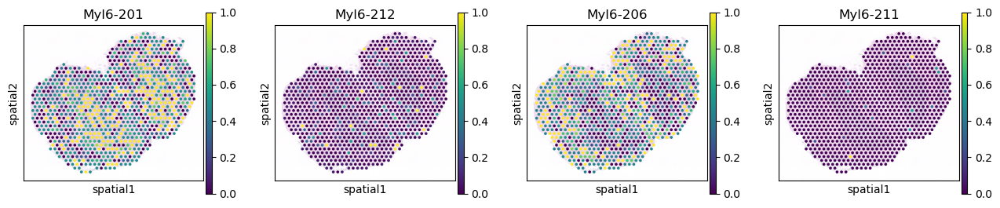

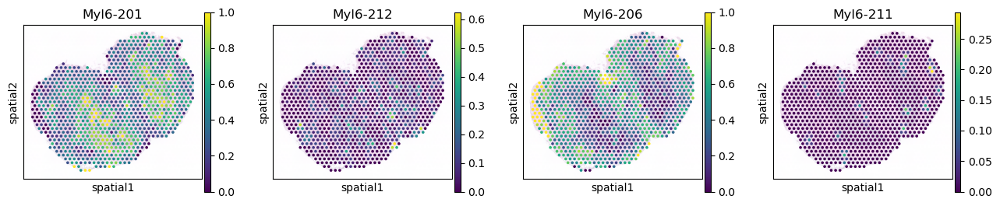

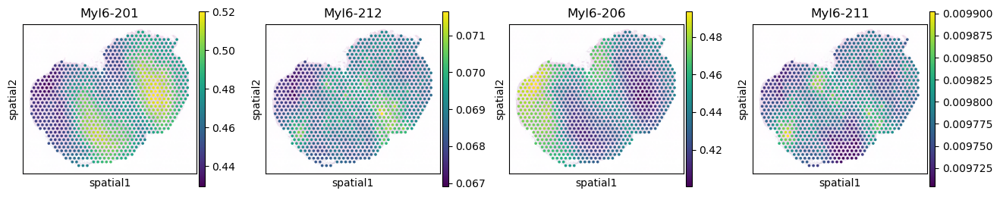

In [38]:
_iso_to_plot = adata_ont_sv.var.index[adata_ont_sv.var['gene_symbol'] == 'Myl6']
_name_to_plot = adata_ont_sv.var.loc[adata_ont_sv.var['gene_symbol'] == 'Myl6', 'transcript_name']
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_ont_sv, color = _iso_to_plot, title = _name_to_plot,
                  img_key = 'lowres', alpha_img=0.3, layer = 'ratios_obs', ncols = len(_iso_to_plot))
    sc.pl.spatial(adata_ont_sv, color = _iso_to_plot, title = _name_to_plot,
                  img_key = 'lowres', alpha_img=0.3, layer = 'ratios_smoothed', ncols = len(_iso_to_plot))
    sc.pl.spatial(adata_ont_sv, color = _iso_to_plot, title = _name_to_plot,
                  img_key = 'lowres', alpha_img=0.3, layer = 'ratios_glmm', ncols = len(_iso_to_plot))

### Clustering

#### Cluster by gene expression

In [39]:
# focus on expressed SVE genes only
_iso_ind = adata_ont.var['gene_symbol'].isin(
    # df_sv_mob.loc[df_sv_mob['is_ont_sve'] & df_sv_mob['is_ont_expressed']].index
     df_sv_mob.loc[df_sv_mob['is_ont_sve']].index
)
_data = adata_ont[:, _iso_ind].copy()

# calculate the total counts per gene
_mapping_matrix = pd.get_dummies(_data.var['gene_symbol'])
_isog_counts = _data[:, _mapping_matrix.index].layers['counts'] @ _mapping_matrix

# create anndata obj
_data = sc.AnnData(
    _isog_counts,
    obs = adata_ont.obs
)

# log normalization
sc.pp.normalize_total(_data, target_sum=1e4)
sc.pp.log1p(_data)
_data.layers['log1p'] = _data.X.copy()

# pca and clustering
sc.tl.pca(_data, layer = 'log1p')
sc.pp.neighbors(_data)
sc.tl.leiden(_data, resolution=0.4, flavor='igraph', n_iterations=2, key_added='ont_sve')

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:233: UserWarning: Some cells have zero counts


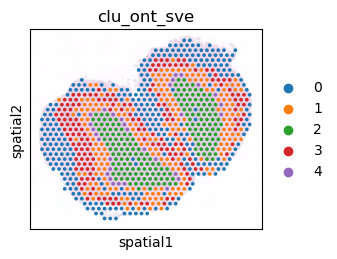

In [40]:
# store clustering results to the reference adata
adata_ont_sv.obs['clu_ont_sve'] = _data.obs['ont_sve']

with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_ont_sv, color = ['clu_ont_sve'], img_key = 'lowres', alpha_img=0.3)

In [41]:
# annotate clusters
adata_ont_sv.obs['clu_ont_sve'] = adata_ont_sv.obs['clu_ont_sve'].cat.rename_categories(
    {'0': 'ONL', '1': 'EPL', '2': 'GCL', '3': 'GL', '4': 'MCL'}
)

#### Cluster by observed (and smoothed) isoform ratio

In [42]:
# focus on expressed SVS genes only
# _data = adata_ont_sv.copy()
# focus on expressed SVE genes only
_iso_ind = adata_ont.var['gene_symbol'].isin(
     df_sv_mob.loc[df_sv_mob['is_ont_svs']].index
)
_data = adata_ont[:, _iso_ind].copy()
_data = calc_smoothed_counts_n_ratios(_data, p = 0.2)

# pca and clustering
sc.tl.pca(_data, layer = 'ratios_smoothed')
sc.pp.neighbors(_data)
sc.tl.leiden(_data, resolution=0.35, flavor='igraph', n_iterations=2, key_added='ont_svs')

Number of spots: 918. Average number of neighbors per spot:  6.00.


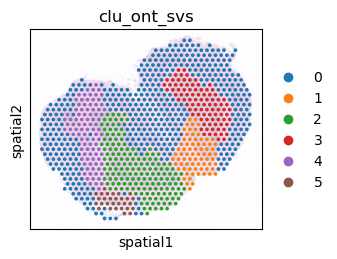

In [43]:
# store clustering results to the reference adata
adata_ont_sv.obs['clu_ont_svs'] = _data.obs['ont_svs']

with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_ont_sv, color = ['clu_ont_svs'], img_key = 'lowres', alpha_img=0.3)

In [44]:
# merge two GCL clusters
adata_ont_sv.obs.loc[adata_ont_sv.obs['clu_ont_svs'] == '3', 'clu_ont_svs'] = '2'
adata_ont_sv.obs['clu_ont_svs'] = adata_ont_sv.obs['clu_ont_svs'].cat.remove_unused_categories()

# annotate clusters
adata_ont_sv.obs['clu_ont_svs'] = adata_ont_sv.obs['clu_ont_svs'].cat.rename_categories(
    {'0': 'ONL', '1': 'EPL', '2': 'GCL', '4': 'GL', '5': 'MCL'}
)

#### Cluster by inferred isoform ratio

In [45]:
# focus on expressed SVS genes only
_data = adata_ont_sv.copy()

# pca and clustering
sc.tl.pca(_data, layer = 'ratios_glmm')
sc.pp.neighbors(_data)
sc.tl.leiden(_data, resolution=0.2, flavor='igraph', n_iterations=2, key_added='ont_svs_glmm')

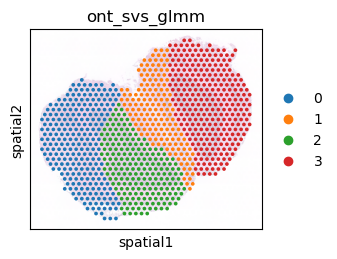

In [46]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(_data, color = ['ont_svs_glmm'], img_key = 'lowres', alpha_img=0.3)

#### Cluster by RBP visium expression

In [47]:
# focus on expressed SVE genes only
_data = adata_visium_rbp[:, adata_visium_rbp.var['is_visium_sve']].copy()

# create anndata obj
_data = sc.AnnData(
    _data.layers['counts'],
    obs = adata_ont.obs
)

# log normalization
sc.pp.normalize_total(_data, target_sum=1e4)
sc.pp.log1p(_data)
_data.layers['log1p'] = _data.X.copy()

# pca and clustering
sc.tl.pca(_data, layer = 'log1p')
sc.pp.neighbors(_data)
sc.tl.leiden(_data, resolution=0.8, flavor='igraph', n_iterations=2, key_added='visium_rbp_sve')

/Users/jysumac/miniforge3/envs/isosde/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:233: UserWarning: Some cells have zero counts


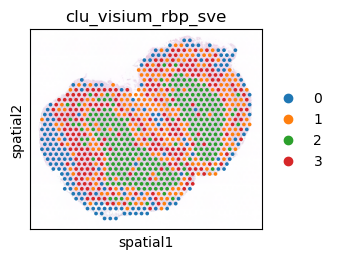

In [48]:
# store clustering results to the reference adata
adata_ont_sv.obs['clu_visium_rbp_sve'] = _data.obs['visium_rbp_sve']

with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_ont_sv, color = ['clu_visium_rbp_sve'], img_key = 'lowres', alpha_img=0.3)

In [49]:
# annotate clusters
adata_ont_sv.obs['clu_visium_rbp_sve'] = adata_ont_sv.obs['clu_visium_rbp_sve'].cat.rename_categories(
    {'0': 'ONL', '1': 'EPL', '2': 'GCL', '3': 'GL'}
)

#### Combinded visualization

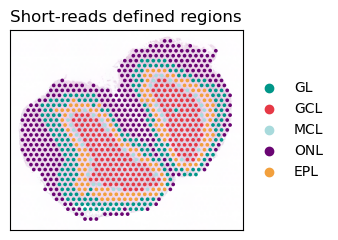

In [50]:
# _palette = {
#     'Olfactory Nerve Layer (ONL)': '#6A0573',
#     'Outer plexiform Layer (EPL)': '#F2A03D',
#     'Glomerular Layer (GL)': '#009688',
#     'Granule Cell Layer (GCL+RMS)': '#E63946',
#     'Mitral Cell Layer (MCL)': '#A8DADC'
# }
_palette = {
    'ONL': '#6A0573',
    'EPL': '#F2A03D',
    'GL': '#009688',
    'GCL': '#E63946',
    'MCL': '#A8DADC'
}

adata_ont_sv.obs['region_abbr'] = adata_ont_sv.obs['region'].cat.rename_categories({
    'Olfactory Nerve Layer (ONL)': 'ONL',
    'Outer plexiform Layer (EPL)': 'EPL',
    'Glomerular Layer (GL)': 'GL',
    'Granule Cell Layer (GCL+RMS)': 'GCL',
    'Mitral Cell Layer (MCL)': 'MCL'
})

with plt.rc_context({"figure.figsize": (3, 3)}):
    axes = sc.pl.spatial(
        adata_ont_sv, color = ['region_abbr'], 
        title = ['Short-reads defined regions'],
        palette = _palette,
        img_key = 'lowres', alpha_img=0.3, wspace = 0,
        show = False
    )
    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()

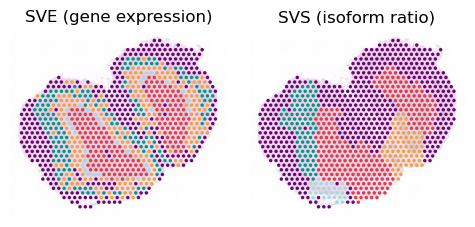

In [51]:
_palette = {
    'ONL': '#6A0573',
    'EPL': '#F2A03D',
    'GL': '#009688',
    'GCL': '#E63946',
    'MCL': '#A8DADC'
}

with plt.rc_context({"figure.figsize": (3, 3)}):
    axes = sc.pl.spatial(
        adata_ont_sv, color = ['clu_ont_sve', 'clu_ont_svs'], 
        title = ['SVE (gene expression)', 'SVS (isoform ratio)'],
        palette = _palette, legend_loc = 'none',
        img_key = 'lowres', alpha_img=0.3, wspace = 0,
        show = False, frameon = False,
    )
    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()

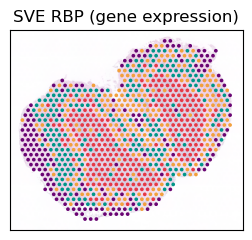

In [52]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    axes = sc.pl.spatial(
        adata_ont_sv, color = ['clu_visium_rbp_sve'], 
        title = ['SVE RBP (gene expression)'],
        palette = _palette, legend_loc = 'none',
        img_key = 'lowres', alpha_img=0.3, wspace = 0,
        show = False, frameon = True,
    )
    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()

### Anndata I/O

#### Save the ONT SVS anndata with cluster and GLMM results

In [53]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/sit_nar_23/"
date = '1107'

adata_ont_sv.write_h5ad(f"{res_dir}/anndata/mob_svs_clu_{date}.h5ad")

#### Load precomputed ONT SVS anndata with cluster and GLMM results

In [13]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/sit_nar_23/"
date = '1107'

adata_ont_sv = sc.read_h5ad(f"{res_dir}/anndata/mob_svs_clu_{date}.h5ad")

### Visualize isoform usage of selected genes

#### Compared with the original differential usage gene list

In [55]:
data_dir = "/Users/jysumac/Projects/SPLISOSM_paper/data/sit_nar_23/"
sit_markers = pd.read_csv(f"{data_dir}/supp_files/mob_marker_iso.csv")
sit_markers['is_ont_svs'] = sit_markers['geneId'].isin(df_sv_mob['is_ont_svs'].index)

In [56]:
# all previously reported genes are spatially variably spliced 
sit_markers.groupby('is_ont_svs')['geneId'].nunique()

is_ont_svs
True    36
Name: geneId, dtype: int64

In [57]:
# SVS genes not reported in the original paper
df_novel_svs_mob = df_sv_mob.loc[
    df_sv_mob['is_ont_svs'] & df_sv_mob['is_ont_expressed'] & 
   (~df_sv_mob.index.isin(sit_markers['geneId']))
]
df_novel_svs_mob.head()

,n_iso,pct_spot_on,count_avg,count_std,perplexity,major_ratio_avg,pvalue_hsic-ir,padj_hsic-ir,pvalue_hsic-ic,padj_hsic-ic,pvalue_hsic-gc,padj_hsic-gc,pvalue_spark-x,padj_spark-x,is_ont_svs,is_ont_sve,is_ont_expressed
gene,,,,,,,,,,,,,,,,,
Rpl5,3,0.527233,0.973856,1.288195,2.143138,0.510067,2.377249e-10,1.482611e-07,1.300023e-19,4.267270e-18,2.257244e-09,1.311585e-08,2.289288e-08,5.695829e-06,True,True,True
Rps24,4,0.844227,2.331155,1.913525,2.093565,0.731776,6.553738e-10,3.065511e-07,5.572602e-17,1.133298e-15,1.291672e-18,3.502490e-17,4.569930e-07,6.363108e-05,True,True,True
Rps9,2,0.906318,5.644880,4.560443,1.776422,0.738518,2.957636e-06,1.106523e-03,1.168523e-44,4.372612e-42,2.930613e-42,7.833111e-40,1.478817e-13,1.246890e-10,True,True,True
Clta,5,0.724401,1.820261,1.999276,2.951403,0.606224,3.548443e-06,1.106523e-03,4.892430e-14,6.538384e-13,1.871586e-17,4.071788e-16,5.427034e-05,3.550265e-03,True,True,True
Rab3b,2,0.471678,1.887800,3.642739,1.274544,0.934218,6.146066e-05,1.257692e-02,4.209934e-15,6.563989e-14,4.324645e-14,5.430478e-13,6.219673e-04,2.368347e-02,True,True,True


#### Visualize novel SVS genes

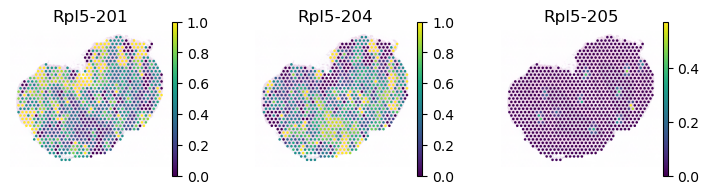

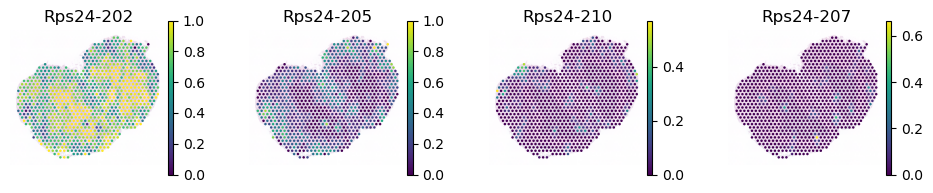

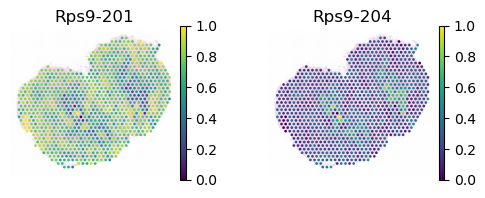

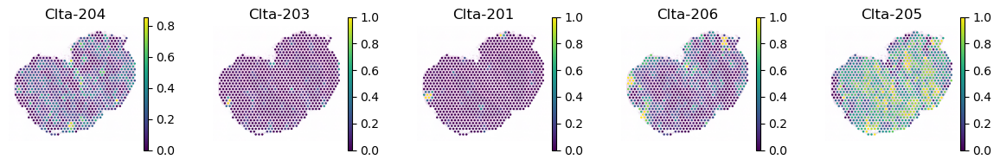

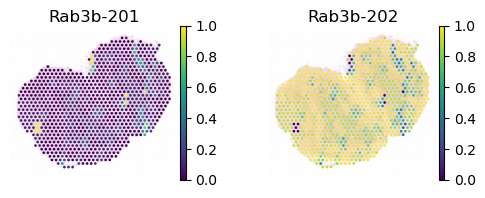

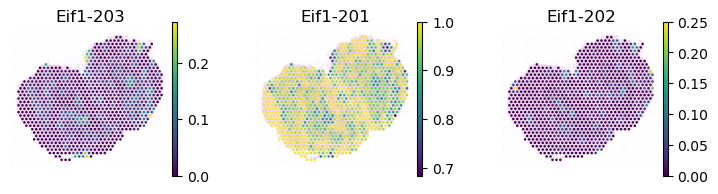

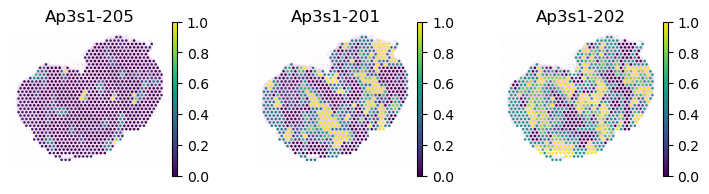

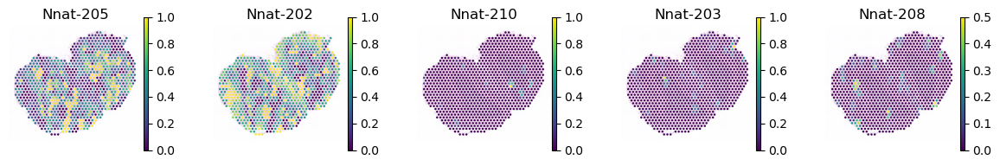

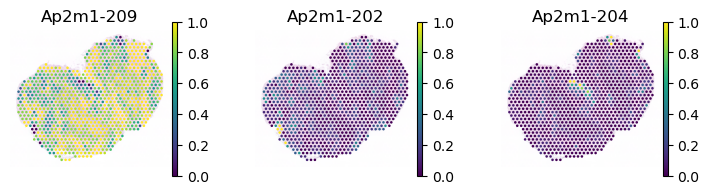

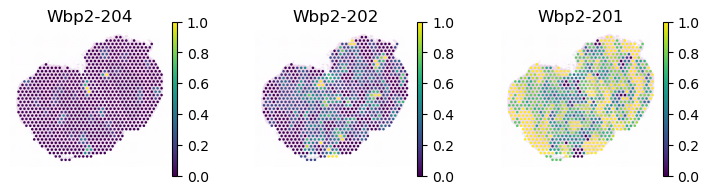

In [58]:
_svs_to_plot = df_novel_svs_mob.head(10).index.to_list()
with plt.rc_context({"figure.figsize": (2, 2)}):
    for _gene in _svs_to_plot:
        _iso_to_plot = adata_ont_sv.var.index[adata_ont_sv.var['gene_symbol'] == _gene]
        _name_to_plot = adata_ont_sv.var.loc[adata_ont_sv.var['gene_symbol'] == _gene, 'transcript_name']
        sc.pl.spatial(
            adata_ont_sv, color = _iso_to_plot, title=_name_to_plot,
            img_key = 'lowres', alpha_img = 0.3, 
            layer = 'ratios_smoothed', ncols = len(_iso_to_plot),
            frameon=False
        )

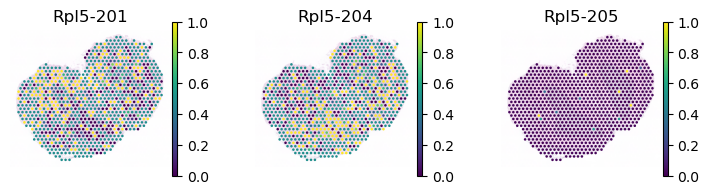

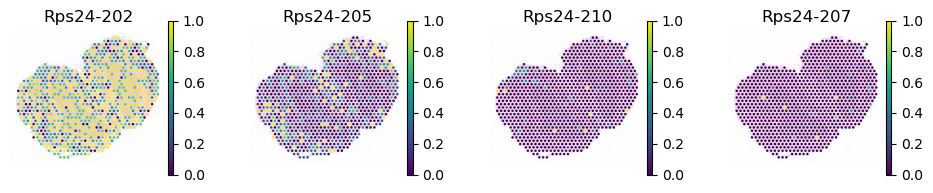

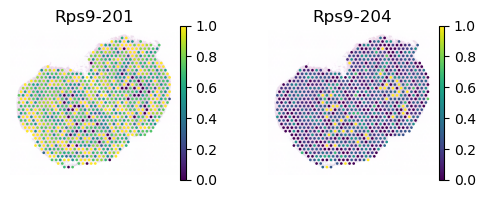

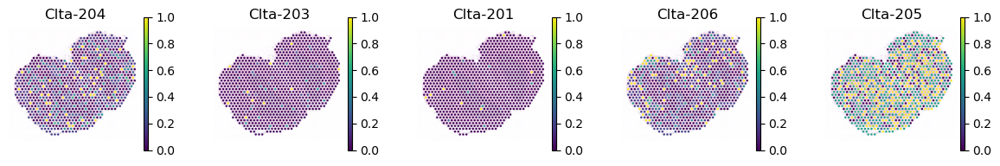

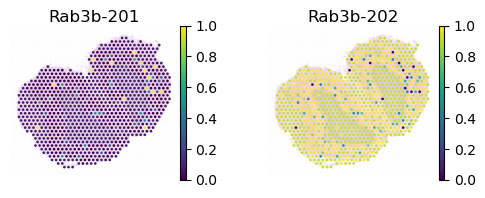

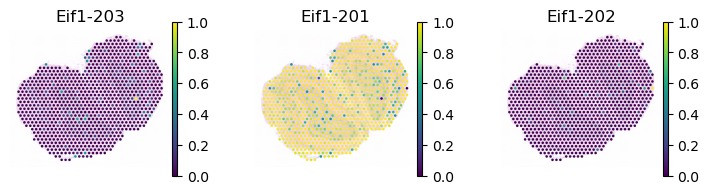

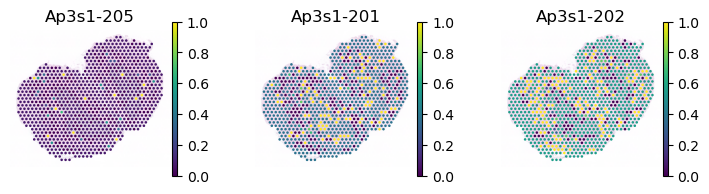

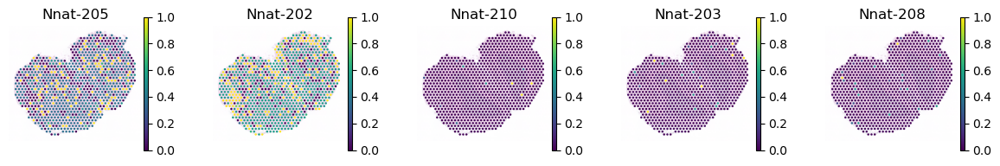

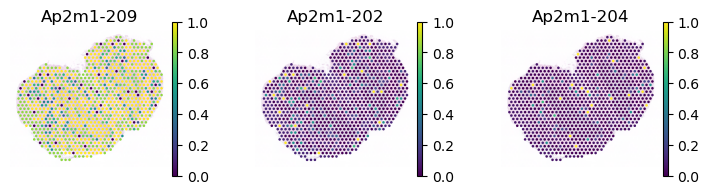

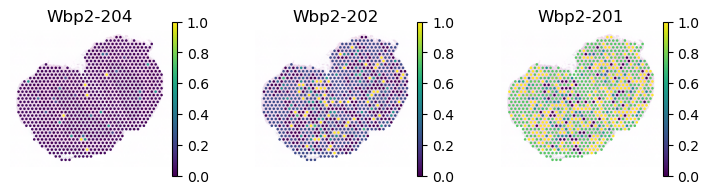

In [59]:
_svs_to_plot = df_novel_svs_mob.head(10).index.to_list()
with plt.rc_context({"figure.figsize": (2, 2)}):
    for _gene in _svs_to_plot:
        _iso_to_plot = adata_ont_sv.var.index[adata_ont_sv.var['gene_symbol'] == _gene]
        _name_to_plot = adata_ont_sv.var.loc[adata_ont_sv.var['gene_symbol'] == _gene, 'transcript_name']
        sc.pl.spatial(
            adata_ont_sv, color = _iso_to_plot, title=_name_to_plot,
            img_key = 'lowres', alpha_img = 0.3, 
            layer = 'ratios_obs', ncols = len(_iso_to_plot),
            frameon=False
        )

## Differential usage (DU) tests with RBP expression

### Load DU test results

In [60]:
# merge parametric and non-parametric test results
def load_du_tests(sample_id):
    df_du_hsic = pd.read_csv(f"{res_dir}/du_np_results/{sample_id}_rbp_du_np_combined_{date}.csv", index_col=[0,1])
    df_du_glmm = pd.read_csv(f"{res_dir}/du_p_results/{sample_id}_rbp_du_p_combined_{date}.csv", index_col=[0,1])
    df_du_rbp = df_du_hsic.join(df_du_glmm).reset_index()
    return df_du_rbp

df_du_mob = load_du_tests('mob')

### Compare DU test p-values

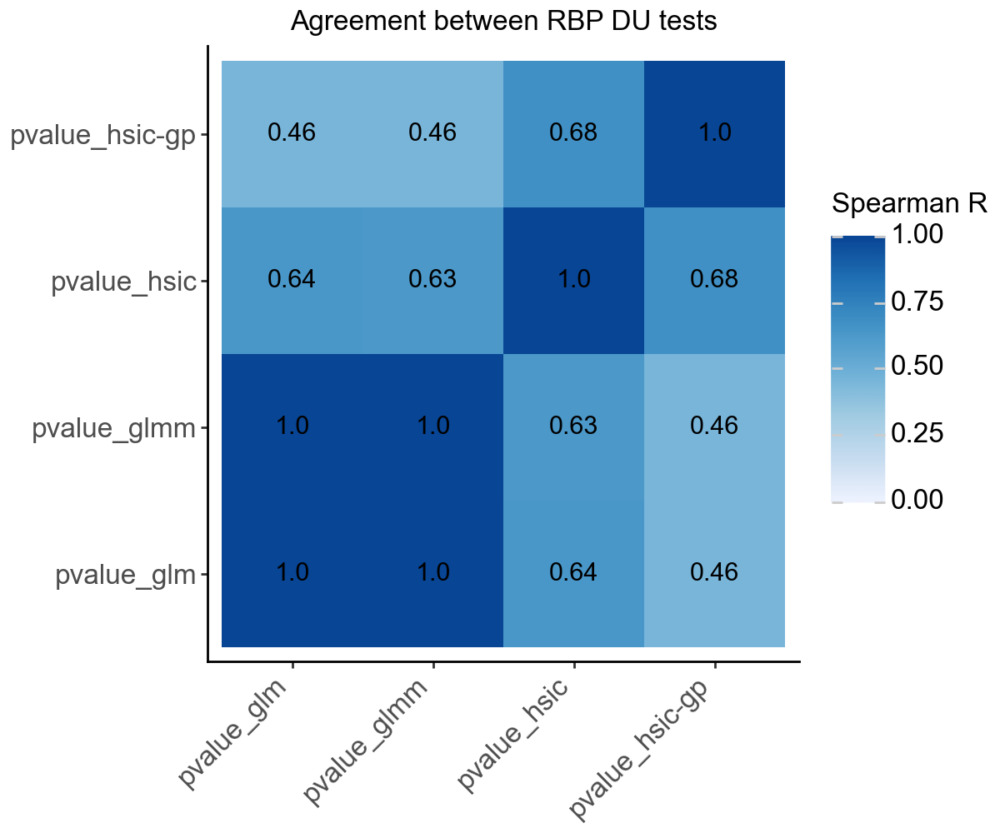

In [61]:
_df = df_du_mob.set_index(['gene', 'covariate'])

_conf_mat = pd.DataFrame(
    spearmanr(_df)[0], 
    columns = _df.columns, 
    index = _df.columns
).reset_index(names='id')
_conf_mat = pd.melt(_conf_mat, id_vars='id').round(2)

# _order = [f'pvalue_{s}_{i}' for i, s in itertools.product(['1', '2'], ['hsic_ratio', 'glm', 'glmm'])]
# _conf_mat['x'] = pd.Categorical(_conf_mat['id'], ordered=True, categories=_order)
# _conf_mat['y'] = pd.Categorical(_conf_mat['variable'], ordered=True, categories=_order)

(
    ggplot(_conf_mat, aes(x = 'id', y = 'variable', fill = 'value')) + 
        geom_tile() + 
        geom_text(aes(label = 'value')) + 
        scale_fill_distiller(limits = (0, 1), direction = 1) + 
        labs(x = '', y = '', fill = 'Spearman R', title = 'Agreement between RBP DU tests') + 
        theme_classic() + 
        theme(
            figure_size=[6, 5],
            text = element_text(family='arial', size = 12), 
            axis_text_x=element_text(rotation=45, hjust = 1, vjust = 1)
        )
)

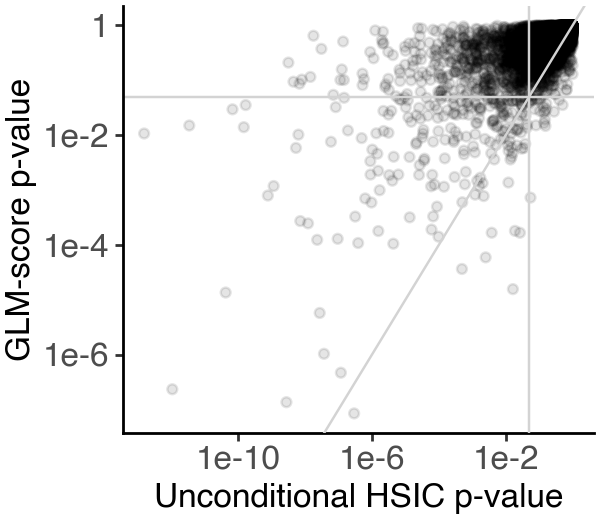

In [62]:
_df = df_du_mob
(
    ggplot(_df, aes(x = 'pvalue_hsic', y = 'pvalue_glm')) +
        # stat_density_2d(levels = 5) + 
        geom_point(alpha = 0.1) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(x = 'Unconditional HSIC p-value', y = 'GLM-score p-value') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[3,2.6],
             text=element_text(size = 12))
)

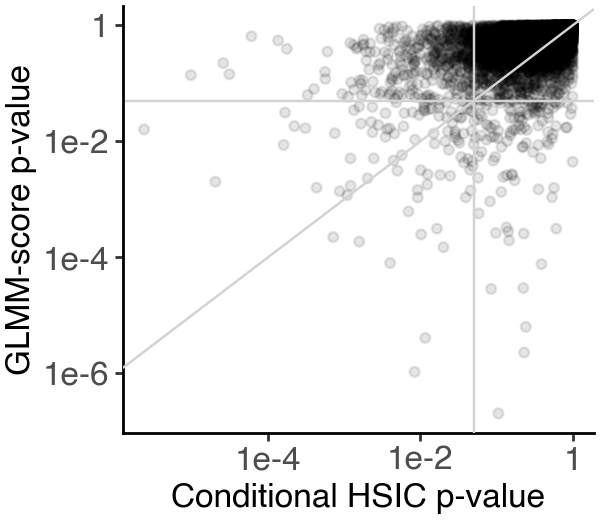

In [63]:
_df = df_du_mob
(
    ggplot(_df, aes(y = 'pvalue_glmm', x = 'pvalue_hsic-gp')) +
        # stat_density_2d(levels = 5) + 
        geom_point(alpha = 0.1) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(y = 'GLMM-score p-value', x = 'Conditional HSIC p-value') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[3,2.6],
             text=element_text(size = 12))
)

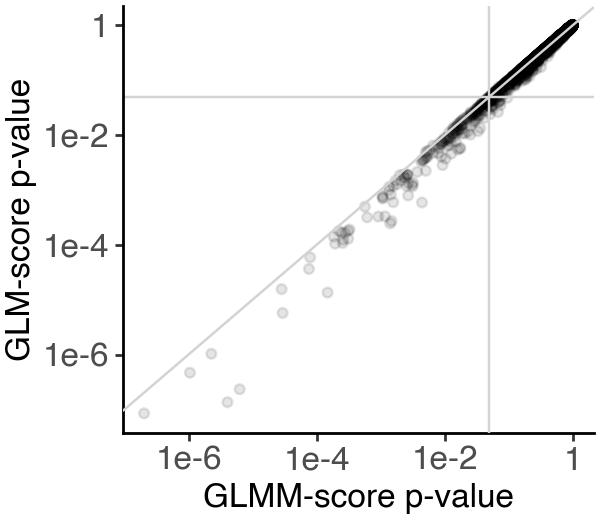

In [64]:
_df = df_du_mob
(
    ggplot(_df, aes(x = 'pvalue_glmm', y = 'pvalue_glm')) +
        # stat_density_2d(levels = 5) + 
        geom_point(alpha = 0.1) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(x = 'GLMM-score p-value', y = 'GLM-score p-value') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[3,2.6],
             text=element_text(size = 12))
)

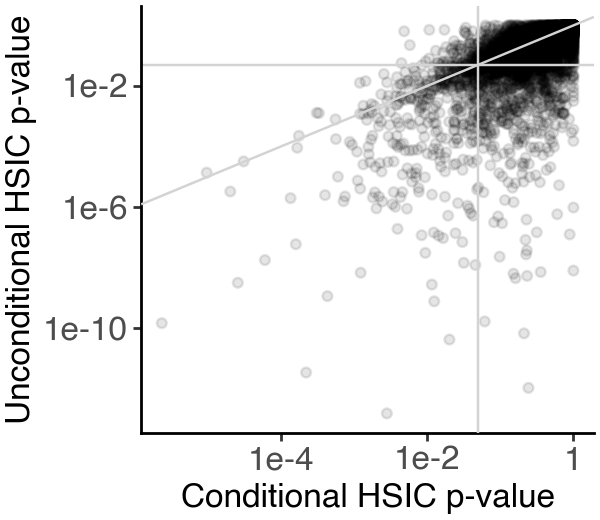

In [65]:
_df = df_du_mob
(
    ggplot(_df, aes(y = 'pvalue_hsic', x = 'pvalue_hsic-gp')) +
        # stat_density_2d(levels = 5) + 
        geom_point(alpha = 0.1) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(y = 'Unconditional HSIC p-value', x = 'Conditional HSIC p-value') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[3,2.6],
             text=element_text(size = 12))
)

### Prioritize RBP-SVS pairs

#### Check overlap with CLIP data

In [66]:
# define significant events
df_du_mob['is_significant'] = (df_du_mob['pvalue_hsic-gp'] < 0.05) & (df_du_mob['pvalue_glmm'] < 0.05)
df_du_mob.groupby(['is_significant']).size()

is_significant
False    7187
True       93
dtype: int64

In [67]:
df_du_mob.loc[df_du_mob['is_significant'], 'covariate'].nunique()

55

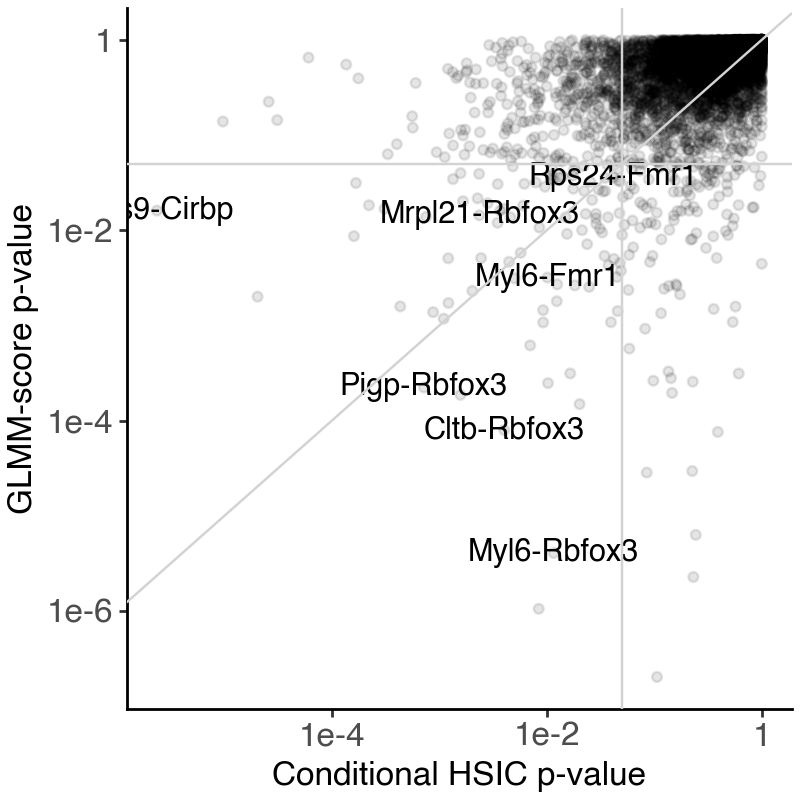

In [68]:
# _df = df_du_mob.loc[df_du_mob['is_significant']]
_df = df_du_mob.copy()
_df['label'] = _df['gene'] + '-' + _df['covariate']

# RBP with CLIP data in POSTAR3-CLIPdb
_rbp_has_clip = pd.read_table(
    '/Users/jysumac/reference/POSTAR3/mouse.rbp_with_clip.txt', header=None
)[0].to_list()
_df['has_clip'] = _df['covariate'].isin(_rbp_has_clip)

(
    ggplot(_df, aes(y = 'pvalue_glmm', x = 'pvalue_hsic-gp')) +
        geom_point(alpha = 0.1) + 
        geom_text(
            _df.loc[(_df['has_clip']) & (_df['is_significant'])],
            # _df.loc[(_df['pvalue_hsic-gp'] < 0.01) | (_df['pvalue_glmm'] < 0.01)],
            aes(label = 'label')
        ) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(y = 'GLMM-score p-value', x = 'Conditional HSIC p-value') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[4, 4],
             text=element_text(size = 12))
)

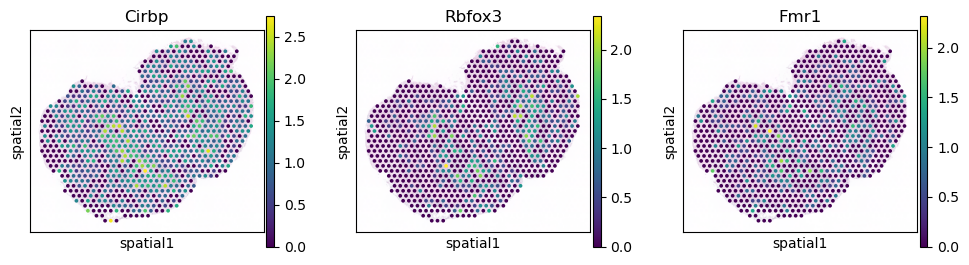

In [69]:
_rbp_to_plot = ['Cirbp', 'Rbfox3', 'Fmr1']
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_visium_rbp, color = _rbp_to_plot, img_key = 'lowres', alpha_img = 0.3, layer = 'log1p', ncols = len(_rbp_to_plot))

#### RBP with most DU associations

In [70]:
# define significant events
df_du_mob['is_significant'] = (df_du_mob['pvalue_hsic-gp'] < 0.05) & (df_du_mob['pvalue_glmm'] < 0.05)
# df_du_mob['is_significant'] = (df_du_mob['pvalue_hsic-gp'] < 0.05)
df_du_mob.groupby('is_significant').size()

is_significant
False    7187
True       93
dtype: int64

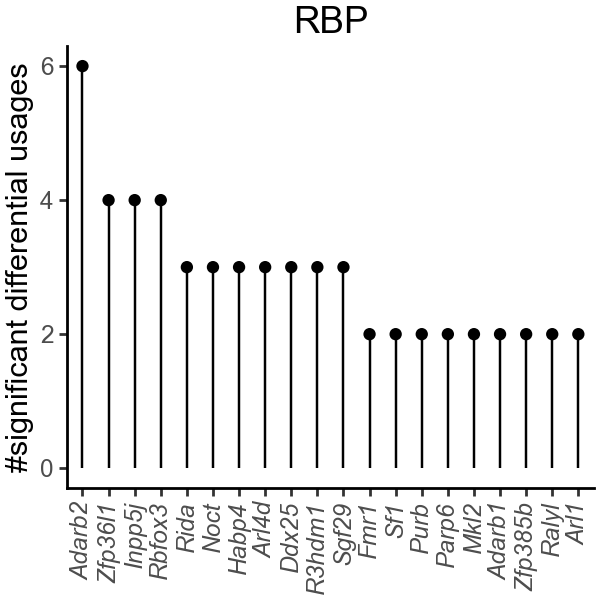

In [71]:
_df = df_du_mob.reset_index().groupby(['covariate'])['is_significant'].sum().to_frame('counts').sort_values(
    'counts', ascending = False
).reset_index()
_df['covariate'] = pd.Categorical(_df['covariate'], ordered=True, categories=_df['covariate'])

(
    ggplot(_df.head(20), aes(x = 'covariate', y = 'counts')) + 
        geom_point() + 
        geom_segment(aes(x = 'covariate', y = 0, xend = 'covariate', yend = 'counts')) +
        # geom_bar(stat = 'identity') + 
        labs(x = '', y = '#significant differential usages', title = 'RBP') + 
        theme_classic() + 
        theme(
            figure_size=(3, 3),
            text=element_text(family='Arial'),
            axis_text_x=element_text(rotation=90, hjust = 0.5, fontstyle = 'italic')
        )
)

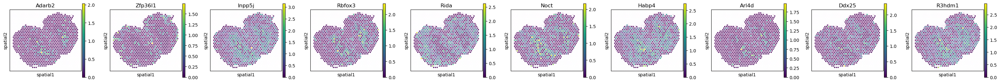

In [72]:
_rbp_to_plot = _df.head(10)['covariate'].to_list()
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.spatial(adata_visium_rbp, color = _rbp_to_plot, img_key = 'lowres', alpha_img = 0.3, layer = 'log1p', ncols = len(_rbp_to_plot))

In [73]:
_df = df_du_mob.copy()
_df.reset_index().loc[_df.reset_index()['covariate'] == 'Cirbp'].sort_values(
    'pvalue_hsic-gp', ascending=True
).head(15)

,index,gene,covariate,pvalue_hsic,pvalue_hsic-gp,pvalue_glm,pvalue_glmm,is_significant
6079,6079,Rps9,Cirbp,1.458552e-10,0.000002,0.013947,0.016056,True
3839,3839,Ndufa10,Cirbp,4.312722e-03,0.007829,0.263194,0.263937,False
3559,3559,Myl6,Cirbp,1.439163e-07,0.012313,0.100978,0.141252,False
1179,1179,Clta,Cirbp,4.265802e-05,0.017515,0.047914,0.052611,False
479,479,Ap3s1,Cirbp,9.066127e-03,0.027547,0.162257,0.167820,False
5659,5659,Rpl13a,Cirbp,1.392749e-03,0.029271,0.555915,0.572686,False
5379,5379,Rabac1,Cirbp,1.202799e-01,0.037418,0.618383,0.616149,False
7199,7199,Wbp2,Cirbp,3.146513e-03,0.045062,0.245088,0.252863,False
2719,2719,Gnas,Cirbp,1.308515e-03,0.050480,0.303200,0.308803,False
1459,1459,Commd3,Cirbp,1.208296e-01,0.056438,0.371609,0.371715,False


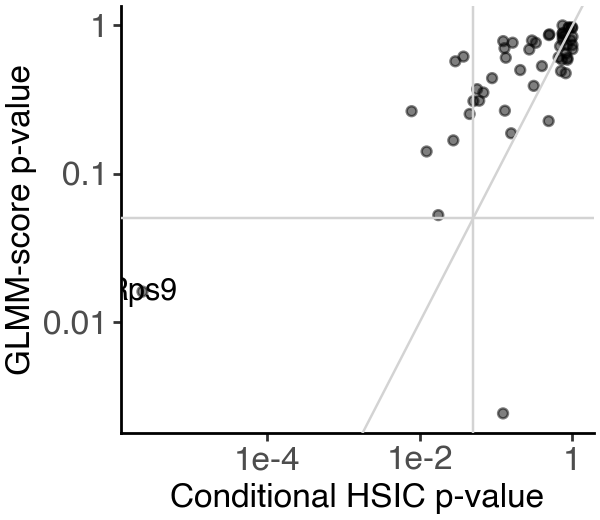

In [74]:
_df = df_du_mob.reset_index().loc[df_du_mob.reset_index()['covariate'] == 'Cirbp', :]
(
    ggplot(_df, aes(y = 'pvalue_glmm', x = 'pvalue_hsic-gp')) +
        geom_point(alpha = 0.5) + 
        geom_text(
            _df.loc[_df['is_significant']],
            aes(label = 'gene')
        ) + 
        geom_hline(yintercept = 0.05, color = 'lightgray') + 
        geom_vline(xintercept = 0.05, color = 'lightgray') + 
        geom_abline(slope = 1, color = 'lightgray') + 
        labs(y = 'GLMM-score p-value', x = 'Conditional HSIC p-value') + 
        scale_x_log10() + 
        scale_y_log10() + 
        theme_classic() + 
        theme(figure_size=[3,2.6],
             text=element_text(size = 12))
)

#### SVS genes with most DU associations

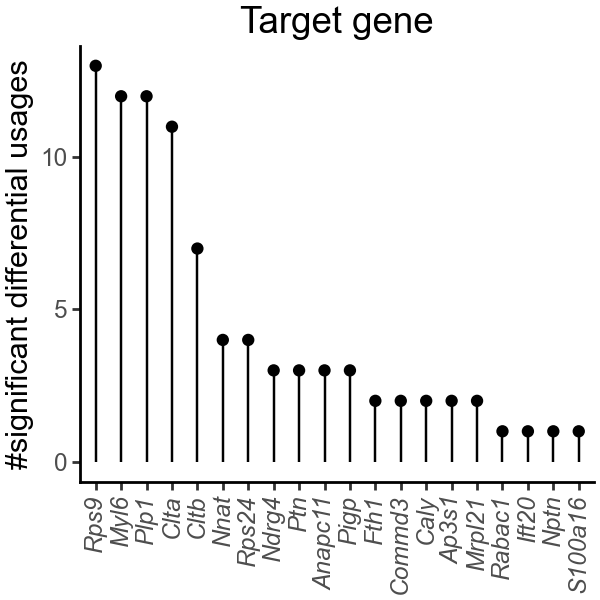

In [75]:
_df = df_du_mob.reset_index().groupby(['gene'])['is_significant'].sum().to_frame('counts').sort_values(
    'counts', ascending = False
).reset_index()
_df['gene'] = pd.Categorical(_df['gene'], ordered=True, categories=_df['gene'])

(
    ggplot(_df.head(20), aes(x = 'gene', y = 'counts')) + 
        geom_point() + 
        geom_segment(aes(x = 'gene', y = 0, xend = 'gene', yend = 'counts')) +
        # geom_bar(stat = 'identity') + 
        labs(x = '', y = '#significant differential usages', title = 'Target gene') + 
        theme_classic() + 
        theme(
            figure_size=(3, 3),
            text=element_text(family='Arial'),
            axis_text_x=element_text(rotation=90, hjust = 0.5, fontstyle = 'italic')
        )
)

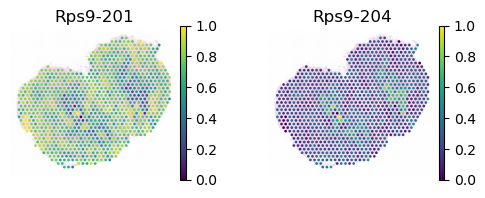

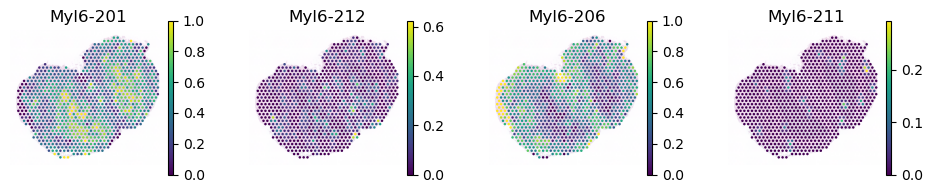

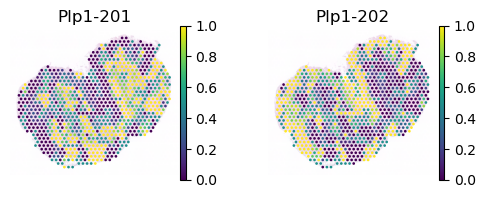

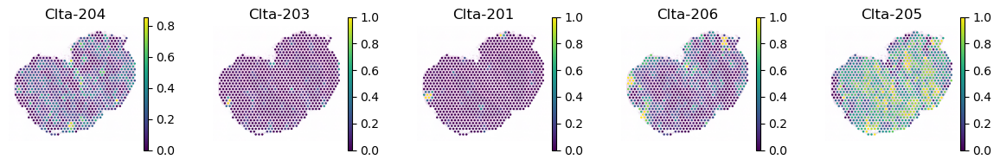

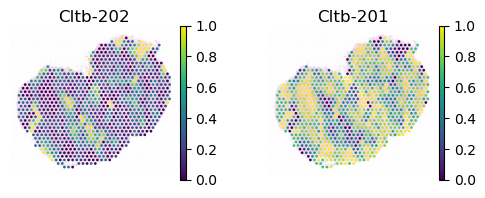

In [76]:
_svs_to_plot = _df.head(5)['gene'].to_list()
with plt.rc_context({"figure.figsize": (2, 2)}):
    for _gene in _svs_to_plot:
        _iso_to_plot = adata_ont_sv.var.index[adata_ont_sv.var['gene_symbol'] == _gene]
        _name_to_plot = adata_ont_sv.var.loc[_iso_to_plot, 'transcript_name']
        sc.pl.spatial(
            adata_ont_sv, color = _iso_to_plot, title = _name_to_plot,
            img_key = 'lowres', alpha_img = 0.3, 
            layer = 'ratios_smoothed', ncols = len(_iso_to_plot),
            frameon=False
        )

In [77]:
_df = df_du_mob.copy()
_df.reset_index().loc[_df.reset_index()['gene'] == 'Rps9'].sort_values(
    'pvalue_hsic-gp', ascending=True
).head(15)

,index,gene,covariate,pvalue_hsic,pvalue_hsic-gp,pvalue_glm,pvalue_glmm,is_significant
6079,6079,Rps9,Cirbp,1.458552e-10,0.000002,0.013947,0.016056,True
6065,6065,Rps9,Cnbp,3.150275e-09,0.000026,0.209832,0.223885,False
6155,6155,Rps9,Ndufa2,1.767467e-08,0.000060,0.648289,0.650998,False
6040,6040,Rps9,Hnrnph2,5.913071e-08,0.000160,0.007564,0.008661,True
6103,6103,Rps9,Ewsr1,3.411548e-12,0.000221,0.014961,0.018271,True
6061,6061,Rps9,Hnrnpa2b1,1.006363e-05,0.000601,0.343894,0.352153,False
6137,6137,Rps9,Puf60,2.230899e-06,0.000752,0.011889,0.013775,True
6139,6139,Rps9,Csdc2,6.761803e-09,0.001233,0.086548,0.103784,False
6083,6083,Rps9,Sarnp,2.545899e-05,0.001338,0.031473,0.034461,True
6064,6064,Rps9,Snrpg,1.335537e-03,0.001766,0.444999,0.455098,False


#### Plot RBP expression

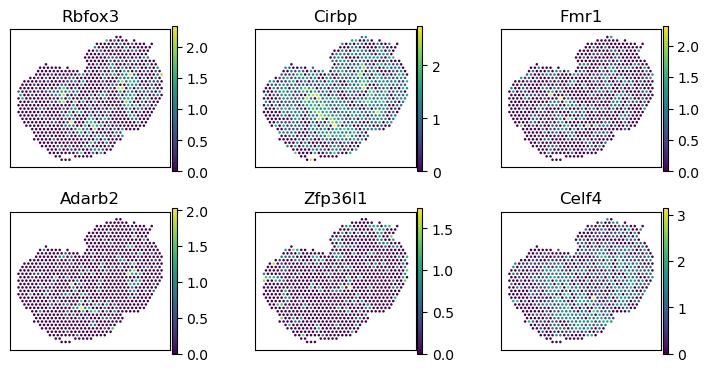

In [78]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    axes = sc.pl.spatial(
        adata_visium_rbp, color = ['Rbfox3', 'Cirbp', 'Fmr1', 'Adarb2', 'Zfp36l1', 'Inpp5j'], 
        ncols = 3, layer = 'log1p',
        title = ['Rbfox3', 'Cirbp', 'Fmr1', 'Adarb2', 'Zfp36l1', 'Celf4'], 
        img_key = 'lowres', alpha_img=0.0, 
        frameon = True, show = False)

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')

    plt.show()


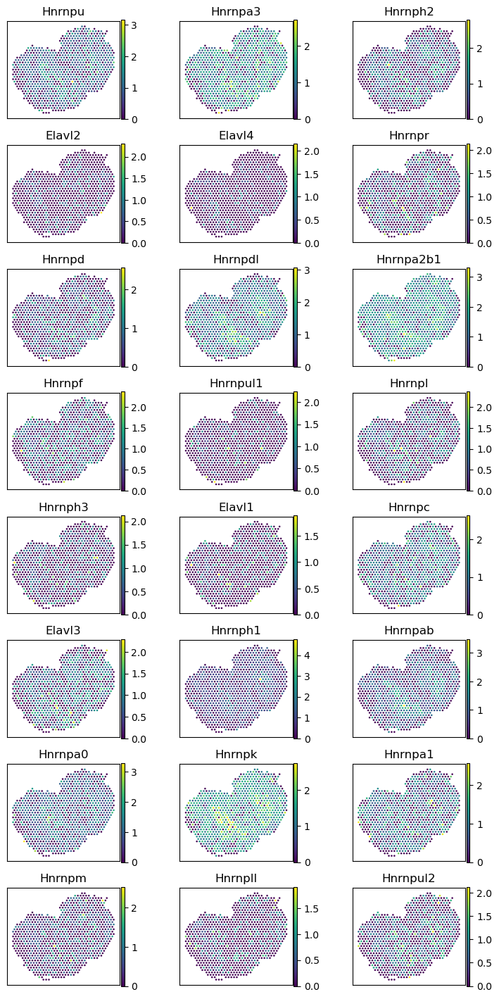

In [14]:
_rbp_to_plots = adata_visium_rbp.var_names[
    adata_visium_rbp.var_names.str.contains('Hnrnp') |
    adata_visium_rbp.var_names.str.contains('Elavl')
]
with plt.rc_context({"figure.figsize": (2, 2)}):
    axes = sc.pl.spatial(
        adata_visium_rbp, color = _rbp_to_plots, 
        ncols = 3, layer = 'log1p',
        img_key = 'lowres', alpha_img=0.0, 
        frameon = True, show = False)

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')

    plt.show()


### Visualize representative pairs

#### Myl6:Rbfox3

In [80]:
_iso_to_plot = ['Myl6..ENSMUST00000164181.1', 'Myl6..ENSMUST00000218127.1']
_iso_names = ['Myl6-201', 'Myl6-206']

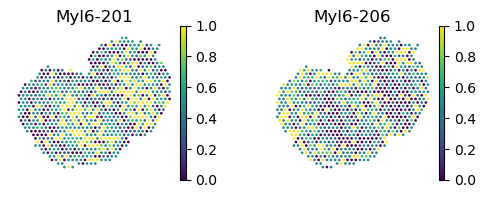

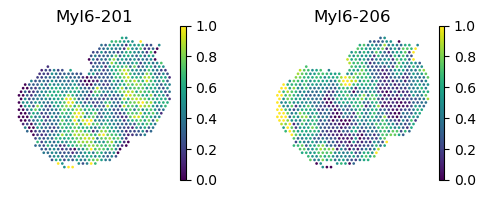

In [81]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    axes = sc.pl.spatial(
        adata_ont_sv, color = _iso_to_plot, title = _iso_names, 
        img_key = 'lowres', alpha_img=0.0,
        layer = 'ratios_obs', ncols = len(_iso_to_plot),
        frameon = False, show = False
    )

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()
    
    axes = sc.pl.spatial(
        adata_ont_sv, color = _iso_to_plot, title = _iso_names, 
        img_key = 'lowres', alpha_img=0.0,
        layer = 'ratios_smoothed', ncols = len(_iso_to_plot),
        frameon = False, show = False
    )

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()

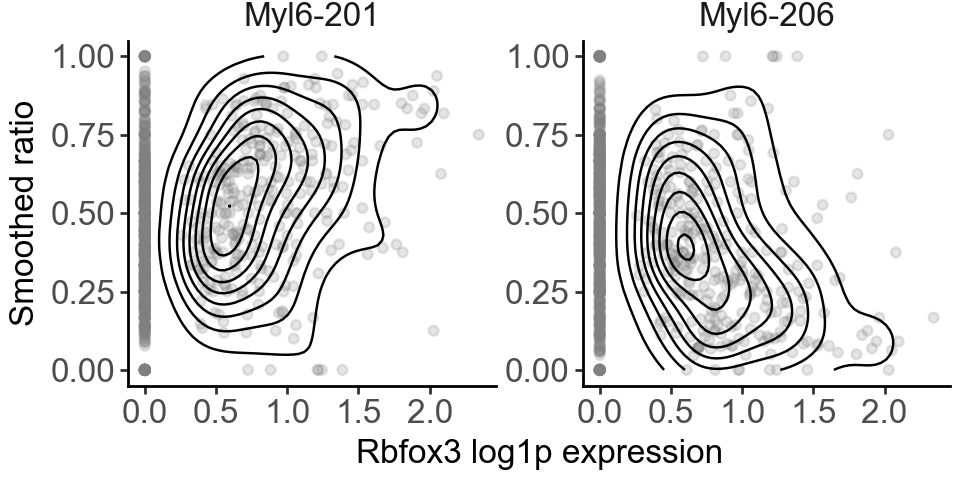

In [82]:
_layer = 'ratios_smoothed'

_df = pd.DataFrame({
    'Rbfox3': adata_visium_rbp[:, 'Rbfox3'].layers['log1p'].toarray().squeeze(),
    'Cirbp': adata_visium_rbp[:, 'Cirbp'].layers['log1p'].toarray().squeeze()
})

for _ind, _name in zip(_iso_to_plot, _iso_names):
    _df[_name] = adata_ont_sv[:, _ind].layers[_layer].squeeze()

df_ratio_n_rbp = _df.melt(id_vars=['Rbfox3', 'Cirbp'], var_name='isoform', value_name=_layer)

(
    ggplot(df_ratio_n_rbp, aes(x = 'Rbfox3', y = _layer)) + 
        facet_wrap('~ isoform', scales='free_y') + 
        geom_point(alpha = 0.2, color = 'gray') + 
        stat_density_2d(
            data=df_ratio_n_rbp.loc[df_ratio_n_rbp['Rbfox3'] > 0],
            levels = 10
        ) + 
        labs(x = 'Rbfox3 log1p expression', y = 'Smoothed ratio') + 
        theme_classic() + 
        theme(
            figure_size=[4.8, 2.4],
            text=element_text(family='Arial', size = 12),
            strip_background=element_blank()
        )
)

#### Cltb:Rbfox3

In [83]:
_iso_to_plot = ['Cltb..ENSMUST00000049575.7', 'Cltb..ENSMUST00000091609.10']
_iso_names = ['Cltb-201', 'Cltb-202']

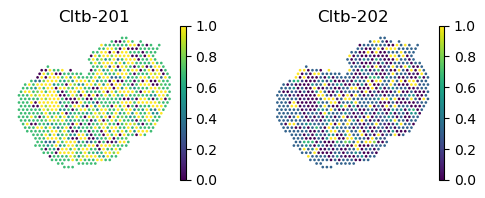

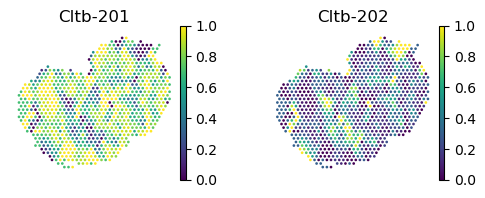

In [84]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    axes = sc.pl.spatial(
        adata_ont_sv, color = _iso_to_plot, title = _iso_names, 
        img_key = 'lowres', alpha_img=0.0,
        layer = 'ratios_obs', ncols = len(_iso_to_plot),
        frameon = False, show = False
    )

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()
    
    axes = sc.pl.spatial(
        adata_ont_sv, color = _iso_to_plot, title = _iso_names, 
        img_key = 'lowres', alpha_img=0.0,
        layer = 'ratios_smoothed', ncols = len(_iso_to_plot),
        frameon = False, show = False
    )

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()

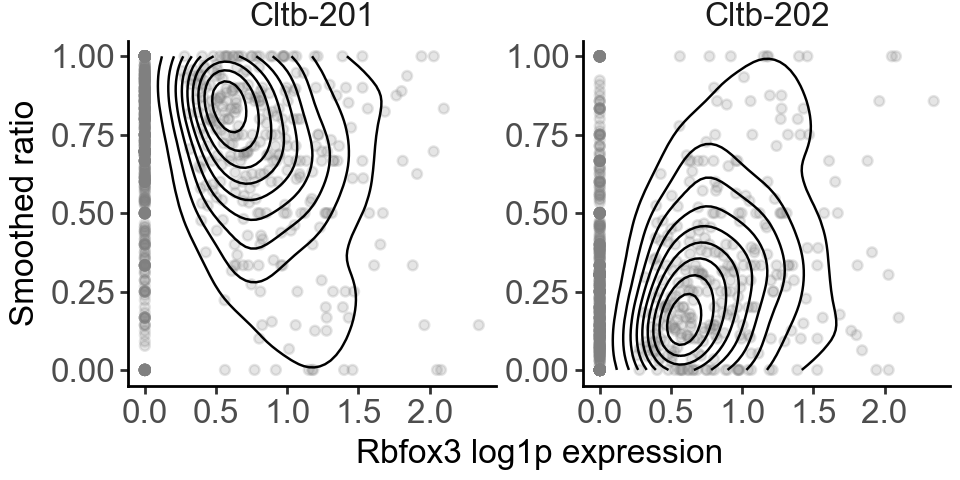

In [85]:
_layer = 'ratios_smoothed'

_df = pd.DataFrame({
    'Rbfox3': adata_visium_rbp[:, 'Rbfox3'].layers['log1p'].toarray().squeeze(),
    'Cirbp': adata_visium_rbp[:, 'Cirbp'].layers['log1p'].toarray().squeeze()
})

for _ind, _name in zip(_iso_to_plot, _iso_names):
    _df[_name] = adata_ont_sv[:, _ind].layers[_layer].squeeze()

df_ratio_n_rbp = _df.melt(id_vars=['Rbfox3', 'Cirbp'], var_name='isoform', value_name=_layer)

(
    ggplot(df_ratio_n_rbp, aes(x = 'Rbfox3', y = _layer)) + 
        facet_wrap('~ isoform', scales='free_y') + 
        geom_point(alpha = 0.2, color = 'gray') + 
        stat_density_2d(
            data=df_ratio_n_rbp.loc[df_ratio_n_rbp['Rbfox3'] > 0],
            levels = 10
        ) + 
        labs(x = 'Rbfox3 log1p expression', y = 'Smoothed ratio') + 
        theme_classic() + 
        theme(
            figure_size=[4.8, 2.4],
            text=element_text(family='Arial', size = 12),
            strip_background=element_blank()
        )
)

#### Rps9:Cirbp

In [86]:
_iso_to_plot = ['Rps9..ENSMUST00000006496.14', 'Rps9..ENSMUST00000108625.7']
_iso_names = ['Rps9-201', 'Rps9-204']

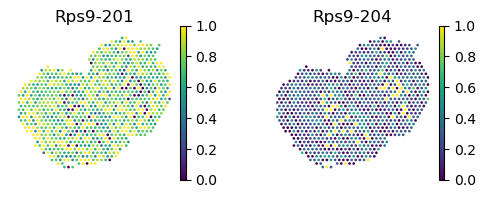

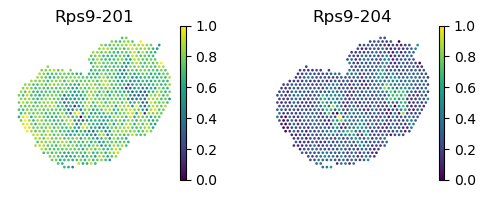

In [87]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    axes = sc.pl.spatial(
        adata_ont_sv, color = _iso_to_plot, title = _iso_names, 
        img_key = 'lowres', alpha_img=0.0,
        layer = 'ratios_obs', ncols = len(_iso_to_plot),
        frameon = False, show = False
    )

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()
    
    axes = sc.pl.spatial(
        adata_ont_sv, color = _iso_to_plot, title = _iso_names, 
        img_key = 'lowres', alpha_img=0.0,
        layer = 'ratios_smoothed', ncols = len(_iso_to_plot),
        frameon = False, show = False
    )

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()

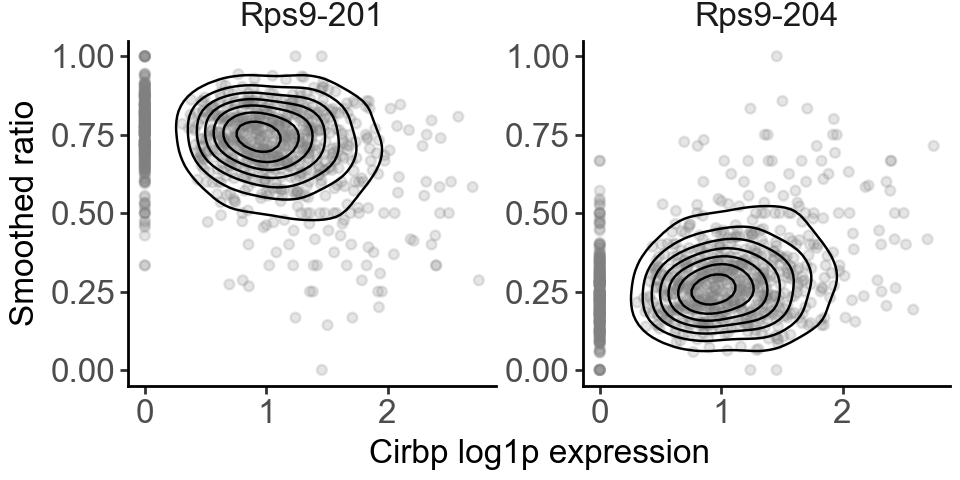

In [88]:
_layer = 'ratios_smoothed'

_df = pd.DataFrame({
    'Rbfox3': adata_visium_rbp[:, 'Rbfox3'].layers['log1p'].toarray().squeeze(),
    'Cirbp': adata_visium_rbp[:, 'Cirbp'].layers['log1p'].toarray().squeeze()
})

for _ind, _name in zip(_iso_to_plot, _iso_names):
    _df[_name] = adata_ont_sv[:, _ind].layers[_layer].squeeze()

df_ratio_n_rbp = _df.melt(id_vars=['Rbfox3', 'Cirbp'], var_name='isoform', value_name=_layer)

(
    ggplot(df_ratio_n_rbp, aes(x = 'Cirbp', y = _layer)) + 
        facet_wrap('~ isoform', scales='free_y') + 
        geom_point(alpha = 0.2, color = 'gray') + 
        stat_density_2d(
            data=df_ratio_n_rbp.loc[df_ratio_n_rbp['Cirbp'] > 0],
            levels = 10
        ) + 
        labs(x = 'Cirbp log1p expression', y = 'Smoothed ratio') + 
        theme_classic() + 
        theme(
            figure_size=[4.8, 2.4],
            text=element_text(family='Arial', size = 12),
            strip_background=element_blank()
        )
)

#### Anapc11:Zfp36l1

In [89]:
_iso_to_plot = ['Anapc11..ENSMUST00000026128.9', 'Anapc11..ENSMUST00000093140.4']
_iso_names = ['Anapc11-201', 'Anapc11-202']

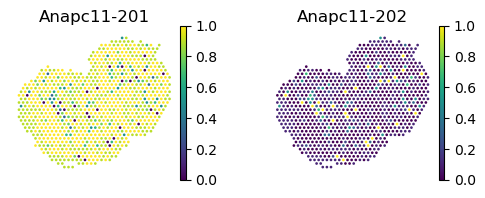

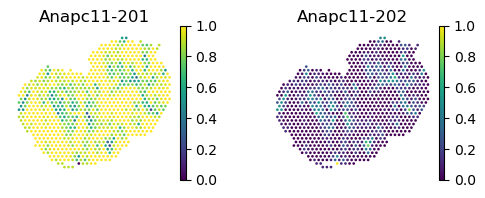

In [90]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    axes = sc.pl.spatial(
        adata_ont_sv, color = _iso_to_plot, title = _iso_names, 
        img_key = 'lowres', alpha_img=0.0,
        layer = 'ratios_obs', ncols = len(_iso_to_plot),
        frameon = False, show = False
    )

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()
    
    axes = sc.pl.spatial(
        adata_ont_sv, color = _iso_to_plot, title = _iso_names, 
        img_key = 'lowres', alpha_img=0.0,
        layer = 'ratios_smoothed', ncols = len(_iso_to_plot),
        frameon = False, show = False
    )

    for _ax in axes:
        _ax.set_xlabel('')
        _ax.set_ylabel('')
        
    plt.show()

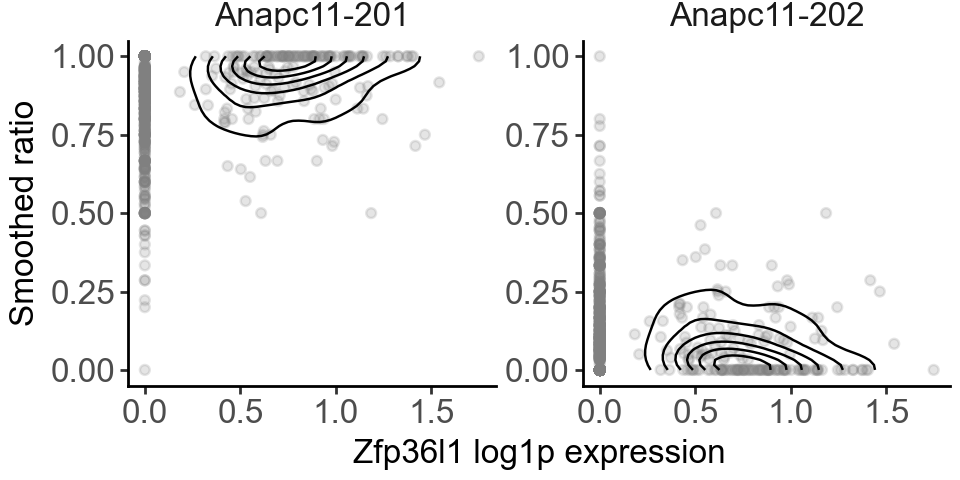

In [91]:
_layer = 'ratios_smoothed'

_df = pd.DataFrame({
    'Rbfox3': adata_visium_rbp[:, 'Rbfox3'].layers['log1p'].toarray().squeeze(),
    'Cirbp': adata_visium_rbp[:, 'Cirbp'].layers['log1p'].toarray().squeeze(),
    'Zfp36l1': adata_visium_rbp[:, 'Zfp36l1'].layers['log1p'].toarray().squeeze(),
})

for _ind, _name in zip(_iso_to_plot, _iso_names):
    _df[_name] = adata_ont_sv[:, _ind].layers[_layer].squeeze()

df_ratio_n_rbp = _df.melt(id_vars=['Rbfox3', 'Cirbp', 'Zfp36l1'], var_name='isoform', value_name=_layer)

(
    ggplot(df_ratio_n_rbp, aes(x = 'Zfp36l1', y = _layer)) + 
        facet_wrap('~ isoform', scales='free_y') + 
        geom_point(alpha = 0.2, color = 'gray') + 
        stat_density_2d(
            data=df_ratio_n_rbp.loc[(df_ratio_n_rbp['Zfp36l1'] > 0)],
            # data=df_ratio_n_rbp.loc[(df_ratio_n_rbp['Zfp36l1'] > 0) & (df_ratio_n_rbp[_layer] < 1) & (df_ratio_n_rbp[_layer] > 0)],
            levels = 10
        ) + 
        labs(x = 'Zfp36l1 log1p expression', y = 'Smoothed ratio') + 
        theme_classic() + 
        theme(
            figure_size=[4.8, 2.4],
            text=element_text(family='Arial', size = 12),
            strip_background=element_blank()
        )
)

## Save source data of main figures for visualization in R

### SV test results

In [92]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/sit_nar_23/"

import os
if not os.path.exists(f"{res_dir}/figures/mob/source_data/"):
    os.makedirs(f"{res_dir}/figures/mob/source_data/")

In [101]:
df_gene_visium.to_csv(f"{res_dir}/figures/mob/source_data/gene_stats_visium.csv", index = False)

#### Save functional enrichment results

In [93]:
# functional enrichment results
df_go.to_csv(f"{res_dir}/figures/mob/source_data/go_top20.csv", index = False)
df_kegg.to_csv(f"{res_dir}/figures/mob/source_data/kegg_top20.csv", index = False)
df_reac.to_csv(f"{res_dir}/figures/mob/source_data/reac_top20.csv", index = False)

#### Save clustering results

In [94]:
# Clustering results
df_clu = adata_ont_sv.obs[['array_row', 'array_col', 'region', 'region_abbr', 'clu_ont_sve', 'clu_ont_svs', 'clu_visium_rbp_sve']]
df_clu.to_csv(f"{res_dir}/figures/mob/source_data/clu_res.csv")

### DU test results

In [95]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/sit_nar_23/"

df_du_mob.to_csv(f"{res_dir}/figures/mob/source_data/du_res_annot.csv", index = False)

#### Save RBP expression

In [15]:
# save RBP expression per spot
_rbp_to_save = [f'Rbfox{i+1}' for i in range(3)] + \
    [f'Celf{i+1}' for i in range(6)] + ['Qk'] + ['Fmr1', 'Adarb2', 'Zfp36l1', 'Cirbp', 'Rida'] + \
    [f'Elavl{i+1}' for i in range(4)] + ['Hnrnpf', 'Hnrnph1', 'Hnrnph2']

df_rbp_expr = []
for _layer in ['log1p', 'counts']:
    df_expr = adata_ont_sv.obs[['array_row', 'array_col']].reset_index(names = 'barcode')
    for _rbp in _rbp_to_save:
        df_expr[_rbp] = adata_visium_rbp[df_expr['barcode'], _rbp].layers[_layer].toarray().squeeze()

    df_expr = df_expr.melt(id_vars=['barcode', 'array_row', 'array_col'], 
                           var_name='gene', value_name='expression')
    df_expr['layer'] = _layer
    df_rbp_expr.append(df_expr)

df_rbp_expr = pd.concat(df_rbp_expr, axis = 0)
df_rbp_expr.to_csv(f"{res_dir}/figures/mob/source_data/rbp_expr.csv", index = False)

In [22]:
adata_visium_rbp.var.loc[adata_visium_rbp.var.index.isin(_rbp_to_save),:]

,features,n_cells,is_rbp,pvalue_adj_hsic,pvalue_adj_sparkx,is_visium_sve
Celf2,Celf2,620,True,1.644941e-04,1.003418e-02,False
Celf1,Celf1,417,True,1.770932e-04,7.231228e-03,True
Fmr1,Fmr1,311,True,3.851434e-03,1.866836e-03,True
Hnrnph2,Hnrnph2,527,True,3.243159e-09,1.914255e-04,True
Celf3,Celf3,196,True,1.317784e-02,5.672846e-01,False
Elavl2,Elavl2,238,True,2.422765e-03,1.000000e+00,False
Elavl4,Elavl4,175,True,5.835748e-04,8.249405e-01,False
Hnrnpf,Hnrnpf,479,True,2.514443e-04,2.894189e-01,False
Cirbp,Cirbp,646,True,2.839679e-10,1.580808e-07,True
Celf5,Celf5,268,True,1.861210e-03,2.242924e-01,False


#### Save isoform usage

In [97]:
# save isoform usage per spot
_svs_to_save = ['Myl6', 'Cltb', 'Rps9', 'Anapc11']

df_svs_ratio = []
for _layer in ['ratios_obs', 'ratios_smoothed', 'ratios_glmm']:
    df_layer = []
    # loop over SVS genes
    for _svs in _svs_to_save:
        df_svs = adata_ont_sv.obs[['array_row', 'array_col']].reset_index(names = 'barcode')
        _iso_list = adata_ont_sv.var_names[adata_ont_sv.var['gene_symbol'] == _svs]
        for _iso in _iso_list:
            df_svs[_iso] = adata_ont_sv[df_svs['barcode'], _iso].layers[_layer].toarray().squeeze()
        df_svs = df_svs.melt(id_vars=['barcode', 'array_row', 'array_col'], 
                             var_name='isoform', value_name='ratio')
        df_svs['gene'] = _svs
        df_layer.append(df_svs)

    # concatenate all genes
    df_layer = pd.concat(df_layer, axis = 0)
    df_layer['layer'] = _layer
    df_svs_ratio.append(df_layer)

df_svs_ratio = pd.concat(df_svs_ratio, axis = 0)
df_svs_ratio.to_csv(f"{res_dir}/figures/mob/source_data/svs_ratio.csv", index = False)

### Sequence feature analysis

#### Save transcript IDs for SV genes

In [98]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/sit_nar_23/"

import os
if not os.path.exists(f"{res_dir}/transcripts/mob"):
    os.makedirs(f"{res_dir}/transcripts/mob")

# _df = df_sv_mob.loc[df_sv_mob['is_ont_expressed']].copy()
_df = df_sv_mob.copy()

In [99]:
adata_ont = sc.read_h5ad(f"{res_dir}/anndata/mob_ont_filtered_{date}.h5ad")

# SVS genes only
iso_svs = adata_ont.var.loc[
    adata_ont.var['gene_symbol'].isin(_df.index[_df['is_ont_svs']]), 
    ['features', 'gene_symbol', 'transcript_id', 'transcript_name']
].sort_values('gene_symbol')
iso_svs.to_csv(f"{res_dir}/transcripts/mob/mob_svs.txid.csv", header = True, index = False)

print(f"Saving IDs for {iso_svs['transcript_id'].nunique()} isoforms of {iso_svs['gene_symbol'].nunique()} SVS genes.")

Saving IDs for 371 isoforms of 147 SVS genes.


In [100]:
# SVE but not SVS genes only
iso_svens = adata_ont.var.loc[
    adata_ont.var['gene_symbol'].isin(_df.index[(~ _df['is_ont_svs']) & _df['is_ont_sve']]), 
    ['features', 'gene_symbol', 'transcript_id', 'transcript_name']
].sort_values('gene_symbol')
iso_svens.to_csv(f"{res_dir}/transcripts/mob/mob_svens.txid.csv", header = True, index = False)

print(f"Saving IDs for {iso_svens['transcript_id'].nunique()} isoforms of {iso_svens['gene_symbol'].nunique()} SVE\\SVS genes.")

Saving IDs for 3097 isoforms of 1240 SVE\SVS genes.


#### Load SUPPA parsed events

In [88]:
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/sit_nar_23/"

df_events_svs = pd.read_table(
    f"{res_dir}/transcripts/mob/suppa.out/mob_svs/n_events.txt", names=['type', 'count'], sep = ' '
)
df_events_svens = pd.read_table(
    f"{res_dir}/transcripts/mob/suppa.out/mob_svens/n_events.txt", names=['type', 'count'], sep = ' '
)

# test for differences in AS type
# _, _pval = chisquare(
#     df_events_svs['count'], 
#     df_events_svens['count'] / df_events_svens['count'].sum() * df_events_svs['count'].sum()
# )
_, _pval, _, _ = chi2_contingency([df_events_svs['count'], df_events_svens['count']])
_pval

0.006210605464706699

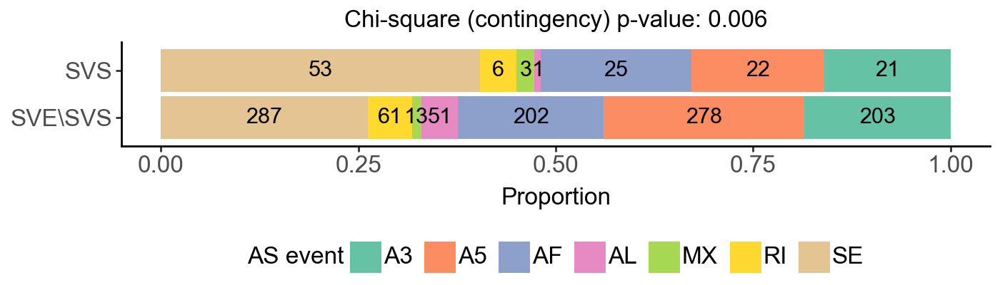

In [89]:
df_events = pd.concat([
    df_events_svs.assign(group = 'SVS'),
    df_events_svens.assign(group = 'SVE\\SVS'),
])
df_events['proportion'] = df_events.groupby('group')['count'].transform(lambda x: x / x.sum())

(
    ggplot(df_events, aes(x = 'group', y = 'count', fill = 'type')) + 
        geom_bar(position="fill", stat="identity") + 
        geom_text(aes(label = 'count', y = 'proportion'), position = position_stack(vjust = .5)) + 
        labs(y = 'Proportion', x = '', fill = 'AS event', title = f'Chi-square (contingency) p-value: {_pval:.3f}') +
        scale_fill_brewer(type = 'qual', palette = 7) + 
        coord_flip() + 
        theme_classic() + 
        theme(
            figure_size=(7,2), 
            legend_position='bottom',
            text = element_text(size = 12, family='arial'),
        ) + 
        guides(fill = guide_legend(nrow = 1))
)